load packages


In [ ]:
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave
import os

In [ ]:
all_images=os.listdir("generative-yoga-images/all-poses/all-poses")
print(f"Total images : {len(all_images)}")

Total images : 1035


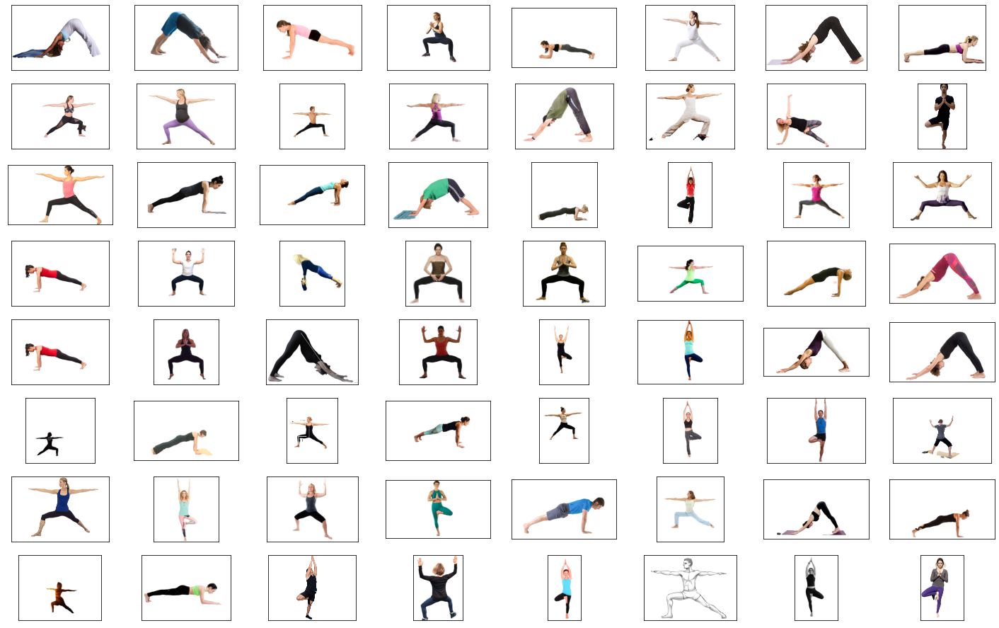

In [ ]:
img_base_path = "generative-yoga-images/all-poses/all-poses"
images=os.listdir("generative-yoga-images/all-poses/all-poses")
# choose 16 random images to display
images_to_display = random.choices(images, k=64)

fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(8, 8, ii + 1, xticks=[], yticks=[])
    
    img = Image.open(os.path.join(img_base_path, img))
    plt.imshow(img)

In [ ]:
images_to_display[18]

'plank (142).jpg'

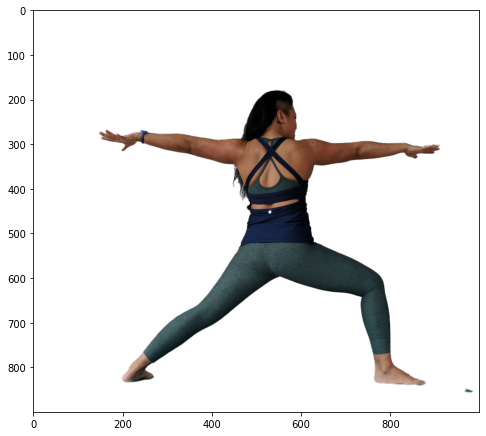

In [ ]:
image_name = 'warrior2 (10).jpg'

# read image
img = Image.open(os.path.join(img_base_path, image_name))

# display image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
image_name[:-4]

'warrior2 (10)'

In [ ]:
# finding annotation of this particular image
# image_name == dogBreed_number

annotation_folders = os.listdir('generative-yoga-images/annotations')
breed_folder = [x for x in annotation_folders if image_name.split(' ')[0] in x]
assert len(breed_folder) == 1, "Multiple Folders Found"

breed_folder = breed_folder[0]
print("Image Folder: ", breed_folder)
annotation_path = os.path.join('generative-yoga-images/annotations', breed_folder, image_name[:-4] +'.xml')
print("Annotation Path: ", annotation_path)


Image Folder:  warrior2
Annotation Path:  generative-yoga-images/annotations/warrior2/warrior2 (10).xml


In [ ]:
!cat '/content/generative-yoga-images/annotations/warrior2/warrior2 (10).xml'

<annotation>
	<folder>warrior2</folder>
	<filename>warrior2 (10).jpg</filename>
	<path>/warrior2/warrior2 (10).jpg</path>
	<source>
		<database>Unspecified</database>
	</source>
	<size>
		<width>1000</width>
		<height>900</height>
		<depth>3</depth>
	</size>
	<object>
		<name>warrior2</name>
		<pose>Unspecified</pose>
		<truncated>Unspecified</truncated>
		<difficult>Unspecified</difficult>
		<bndbox>
			<xmin>134</xmin>
			<ymin>162</ymin>
			<xmax>911</xmax>
			<ymax>861</ymax>
		</bndbox>
	</object>
</annotation>

Bounding Box:  (134, 162, 911, 861)


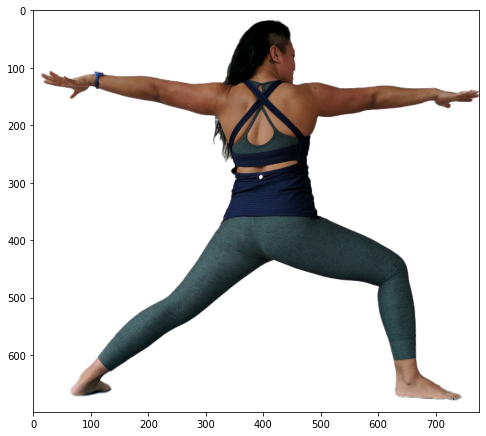

In [ ]:
### Getting Bounding Box of dog (ROI) in Image
tree = ET.parse(annotation_path)
root = tree.getroot()
objects = root.findall('object')
for obj in objects:
    bndbox = obj.find('bndbox')
    xmin = int(bndbox.find('xmin').text)
    ymin = int(bndbox.find('ymin').text)
    xmax = int(bndbox.find('xmax').text)
    ymax = int(bndbox.find('ymax').text)
bbox = (xmin, ymin, xmax, ymax)
print("Bounding Box: ", bbox)

# crop image
img = img.crop(bbox)

# display crop image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
#!ls all-poses/all-poses

In [ ]:
root_images = "generative-yoga-images/all-poses/all-poses/"
root_annots = "generative-yoga-images/annotations/"
INPUT_DATA_DIR = "generative-yoga-images/all-poses/all-poses/"
IMG_DIR = "generated-images"
ComputeLB = False 
PosesOnly = True

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000


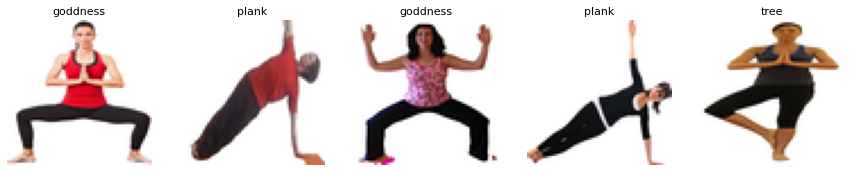

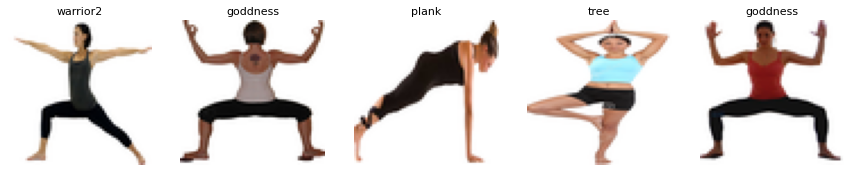

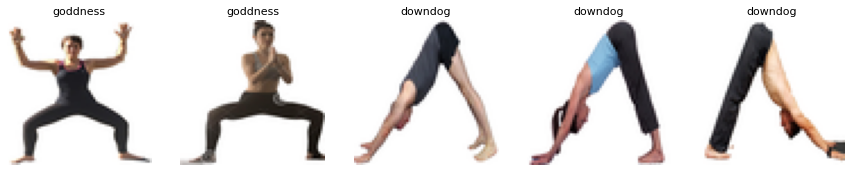

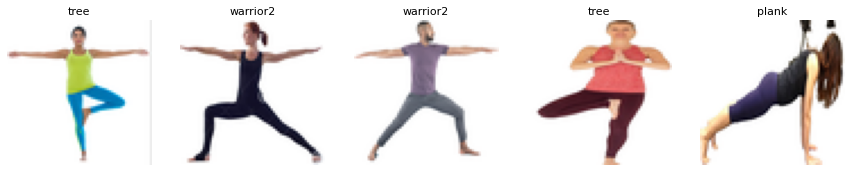

In [ ]:
import numpy as np, pandas as pd, os
import xml.etree.ElementTree as ET 
import matplotlib.pyplot as plt, zipfile 
from PIL import Image, ImageFile
from glob import glob
ImageFile.LOAD_TRUNCATED_IMAGES = True

ROOT = 'generative-yoga-images/'
IMAGES = os.listdir(ROOT + 'all-poses/all-poses/')
#poses = os.listdir(ROOT + 'annotations/') 
poses=['tree', 'plank', 'goddness', 'downdog', 'warrior2'] 

idxIn = 0; namesIn = []
imagesIn = np.zeros((1038,64,64,3))

# CROP WITH BOUNDING BOXES TO GET DOGS ONLY
#https://www.kaggle.com/paulorzp/show-annotations-and-breeds
if PosesOnly:
    for pose in poses:
        for dog in os.listdir(ROOT+'annotations/'+pose):
            try: img = Image.open(ROOT+'all-poses/all-poses/'+dog[:-4]+'.jpg').convert('RGB') 
            except: continue           
            tree = ET.parse(ROOT+'annotations/'+pose+'/'+dog)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                bbox = (xmin, ymin, xmax, ymax)
                img2 = img.crop(bbox)
                img2 = img2.resize((64,64), Image.ANTIALIAS)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                if idxIn%50==0: print(idxIn)
                namesIn.append(pose)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]


#     # RANDOMLY CROP FULL IMAGES
# else:
#     x = np.random.choice(np.arange(20579),10000)
#     for k in range(len(x)):
#         img = Image.open(ROOT + 'all-poses/all-poses/' + IMAGES[x[k]])
#         w = img.size[0]
#         h = img.size[1]
#         sz = np.min((w,h))
#         a=0; b=0
#         if w<h: b = (h-sz)//2
#         else: a = (w-sz)//2
#         img = img.crop((0+a, 0+b, sz+a, sz+b))  
#         img = img.resize((64,64), Image.ANTIALIAS)   
#         imagesIn[idxIn,:,:,:] = np.asarray(img)
#         namesIn.append(IMAGES[x[k]])
#         if idxIn%1000==0: print(idxIn)
#         idxIn += 1
    

#fig = plt.figure(figsize=(8, 12))
#plt.imshow(img)

# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,20)
for k in range(4):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not PosesOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]],fontsize=11)
        plt.imshow(img)
    plt.show()

### **Generator**

In [ ]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 4x4x512
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 4x4x512 -> 8x8x256
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 8x8x256 -> 16x16x128
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
                # 16x16x128 -> 32x32x64
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        

        # 32x32x64 -> 64x64x32
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=32,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 64x64x32 -> 64x64x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out


### **Discriminator**

In [ ]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 64x64x3 -> 32x32x32
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 32x32x32 -> 16x16x64
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 16x16x64 -> 8x8x128
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
         # 8x8x128 -> 8x8x256
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 8x8x256 -> 4x4x512
        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

# **Loss and Optimizer**

In [ ]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [ ]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [ ]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

### **Utils**

In [ ]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()


In [ ]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [ ]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [ ]:
def generate (sess, input_z, out_channel_dim):
    print (">> Generating 1k images ...")
    for i in tqdm(range(100)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        for j in range(len(imgs)):
            imsave(os.path.join(IMG_DIR, f'pose_{i}_{j}.png'), imgs[j])

In [ ]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [ ]:
  def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

# **Training**

In [ ]:
!mkdir images
!ls

generated-images  generative-yoga-images  images  sample_data


In [ ]:
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()

hyperparameters

In [ ]:
IMAGE_SIZE = 64
NOISE_SIZE = 100
LR_D = 0.0005
LR_G = 2e-4
BATCH_SIZE = 64
EPOCHS = 100
BETA1_G = 0.5
BETA1_D = 0.5
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

training loop

In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


>> Start training...


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1719: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/convolutional.py:1294: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  warnings.warn('`tf.layers.conv2d_transpose` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/normalization.py:308: UserWarning: `tf.layers.batch_

Epoch 1/100 
Duration: 173.84253 
D Loss: 1.44248 
G Loss: 11.19368


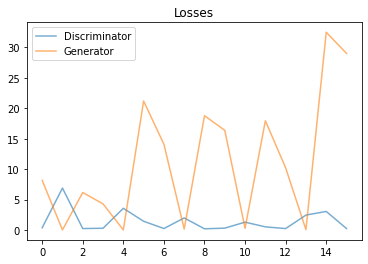

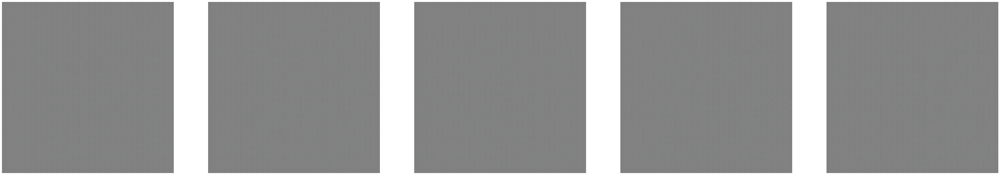

Epoch 2/100 
Duration: 172.10471 
D Loss: 1.88173 
G Loss: 10.69550


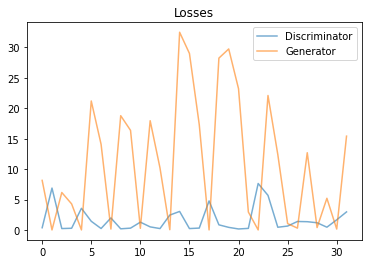

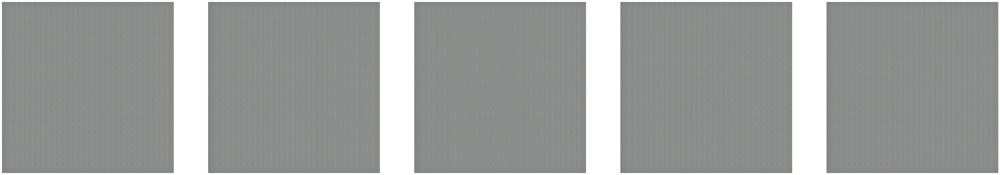

Epoch 3/100 
Duration: 172.16973 
D Loss: 1.11470 
G Loss: 3.41420


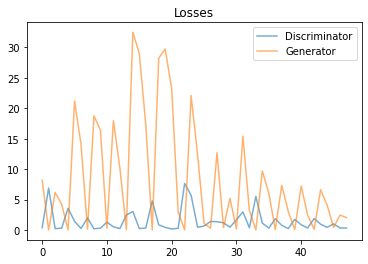

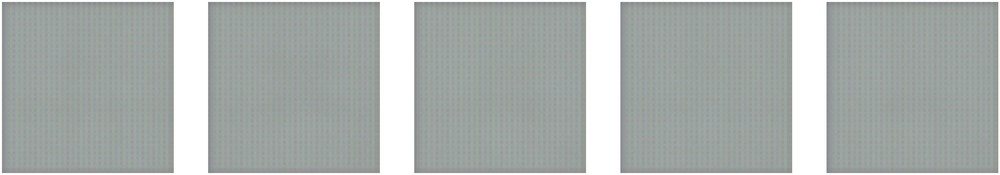

Epoch 4/100 
Duration: 171.56266 
D Loss: 0.52682 
G Loss: 1.70443


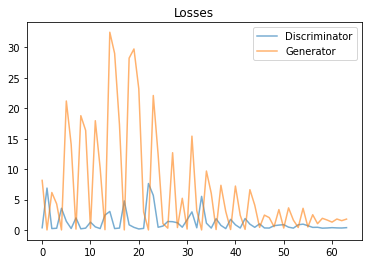

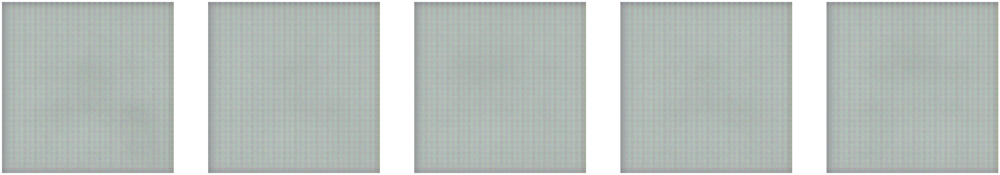

Epoch 5/100 
Duration: 172.29305 
D Loss: 0.61185 
G Loss: 2.17970


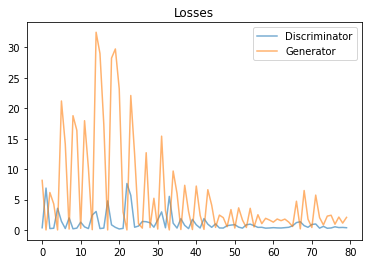

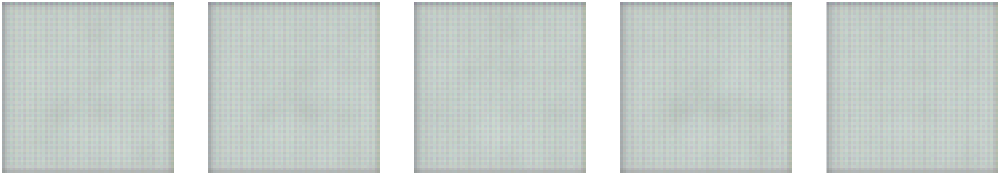

Epoch 6/100 
Duration: 172.68546 
D Loss: 0.62234 
G Loss: 2.07582


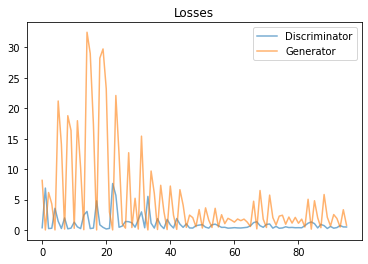

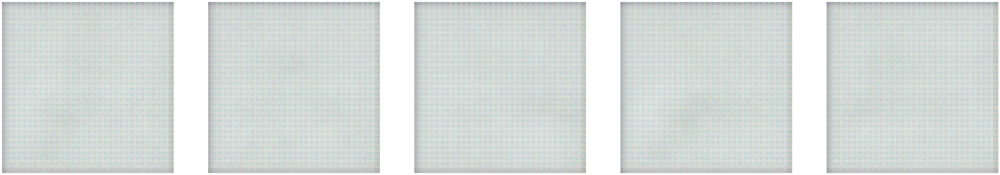

Epoch 7/100 
Duration: 171.08219 
D Loss: 0.48865 
G Loss: 2.00040


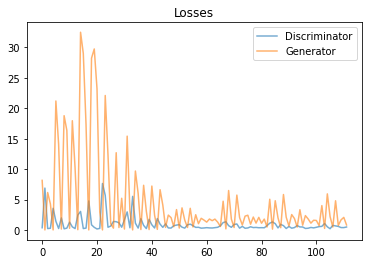

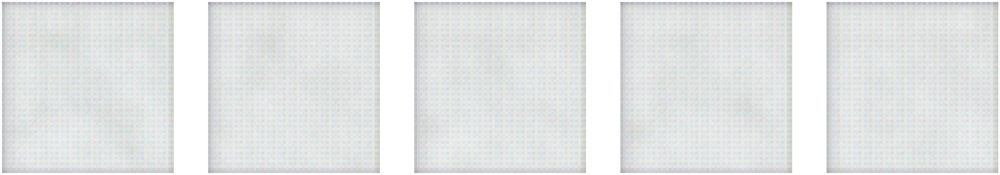

Epoch 8/100 
Duration: 171.47101 
D Loss: 0.47614 
G Loss: 2.17914


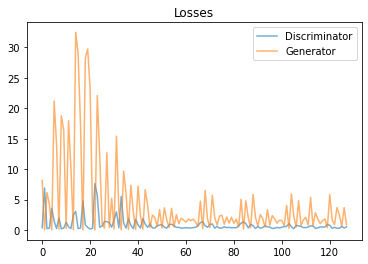

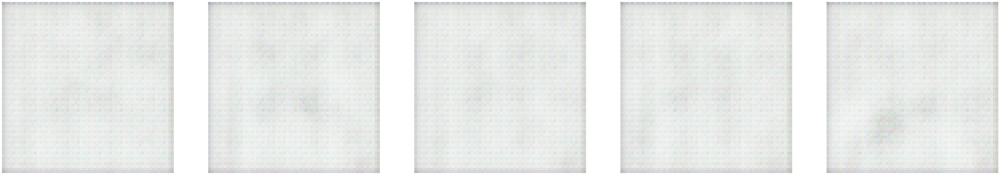

Epoch 9/100 
Duration: 172.50512 
D Loss: 0.50137 
G Loss: 2.11944


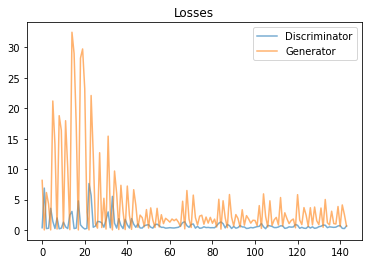

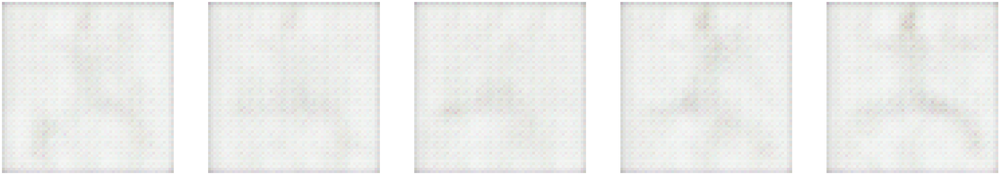

Epoch 10/100 
Duration: 171.98321 
D Loss: 0.35275 
G Loss: 1.77222


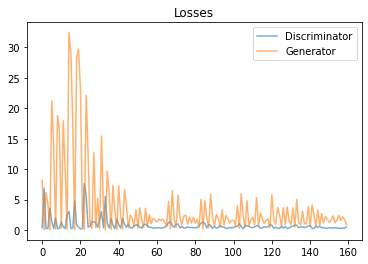

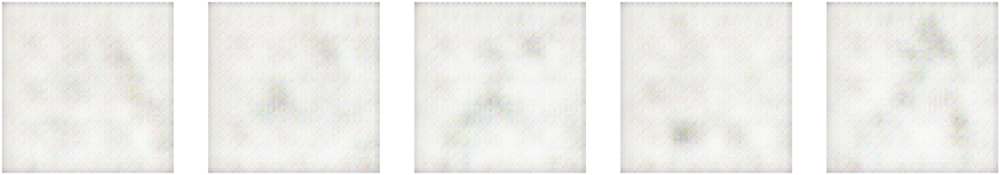

Epoch 11/100 
Duration: 175.85719 
D Loss: 0.52023 
G Loss: 2.19516


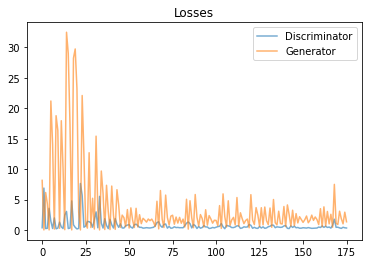

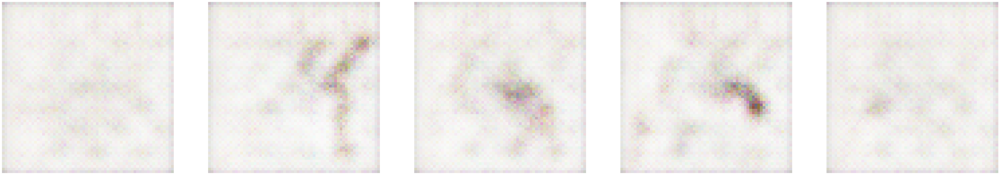

Epoch 12/100 
Duration: 171.15091 
D Loss: 0.40612 
G Loss: 1.82389


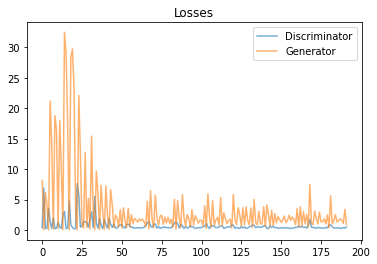

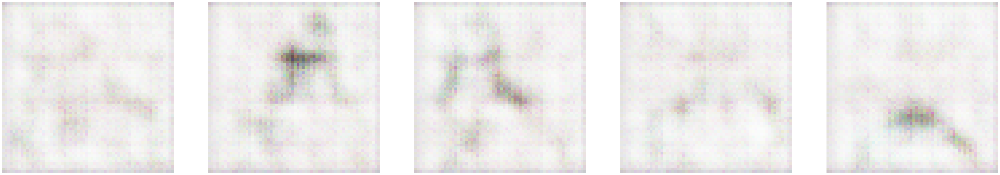

Epoch 13/100 
Duration: 171.11132 
D Loss: 0.37242 
G Loss: 2.11253


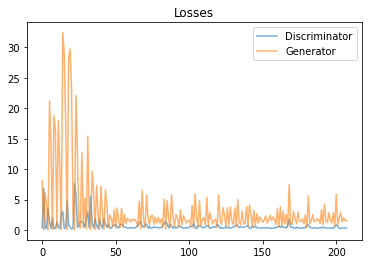

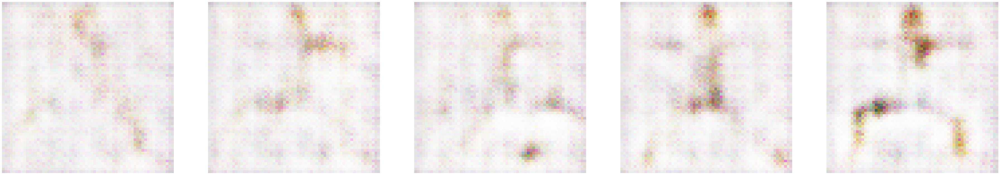

Epoch 14/100 
Duration: 170.94889 
D Loss: 0.41792 
G Loss: 2.19687


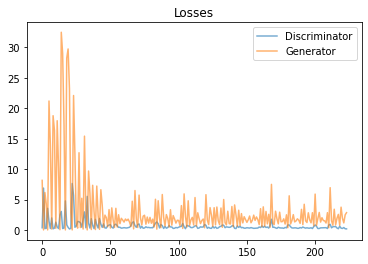

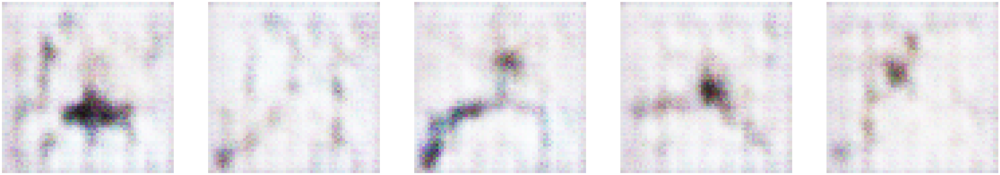

Epoch 15/100 
Duration: 169.48986 
D Loss: 0.27055 
G Loss: 1.95436


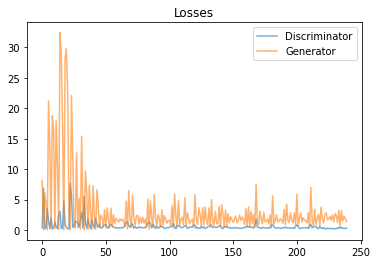

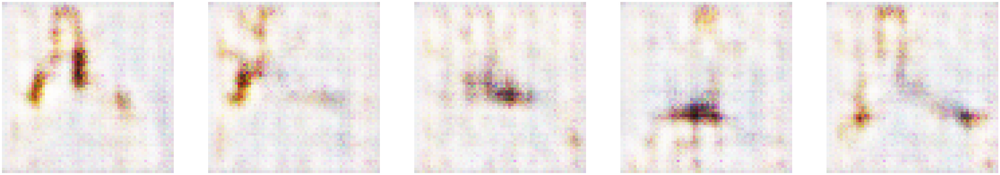

Epoch 16/100 
Duration: 170.14212 
D Loss: 0.43651 
G Loss: 2.41928


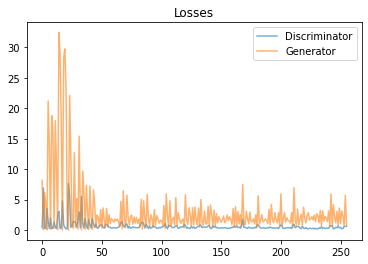

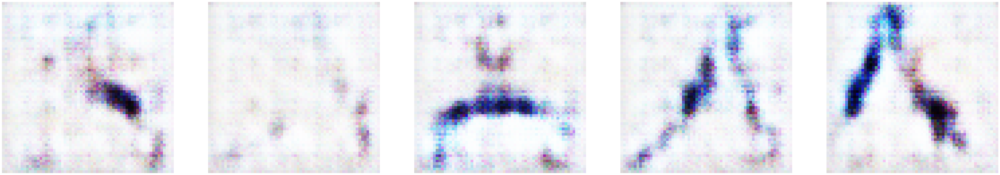

Epoch 17/100 
Duration: 170.33558 
D Loss: 0.33078 
G Loss: 2.27785


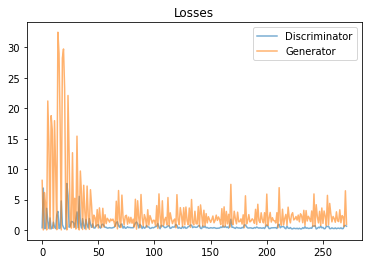

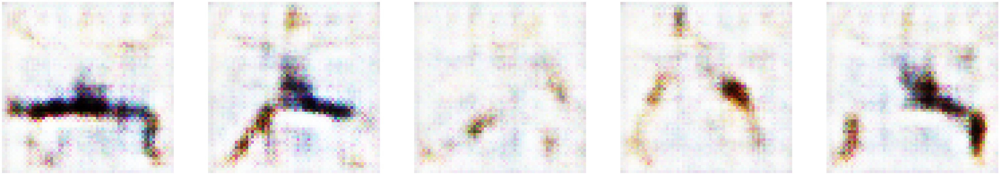

Epoch 18/100 
Duration: 172.68704 
D Loss: 0.35530 
G Loss: 2.25814


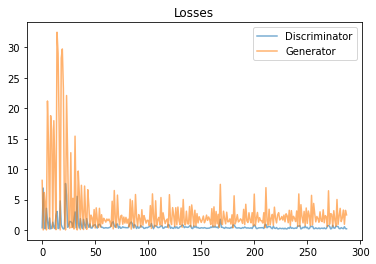

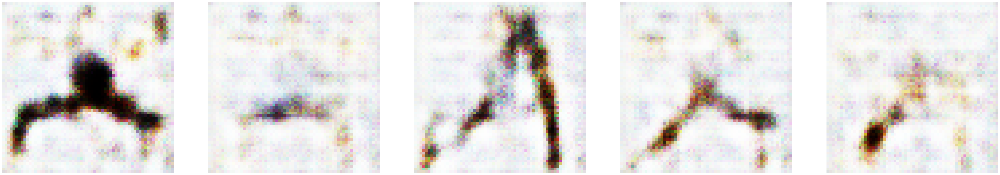

Epoch 19/100 
Duration: 171.83206 
D Loss: 0.34758 
G Loss: 2.24859


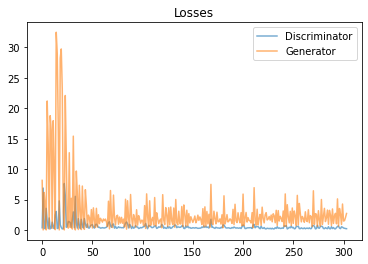

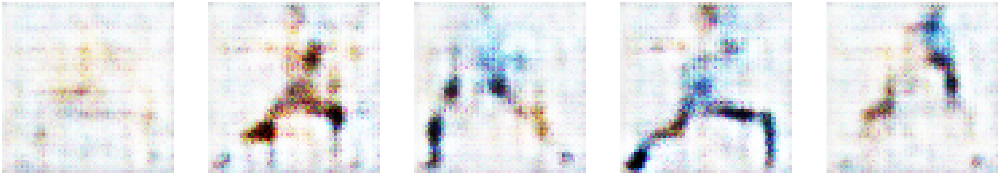

Epoch 20/100 
Duration: 171.87206 
D Loss: 0.44399 
G Loss: 2.46391


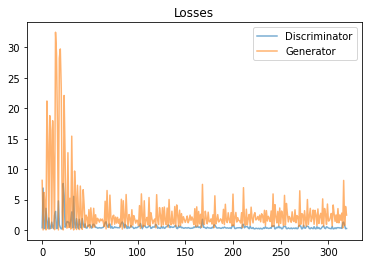

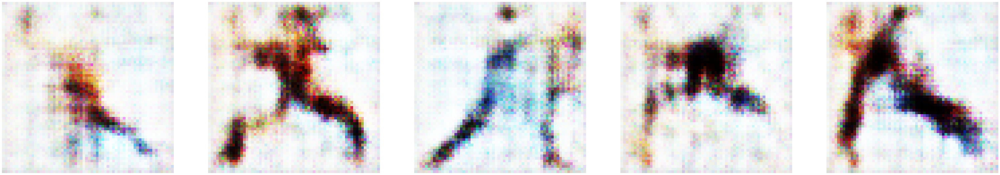

Epoch 21/100 
Duration: 173.40202 
D Loss: 0.36346 
G Loss: 2.30115


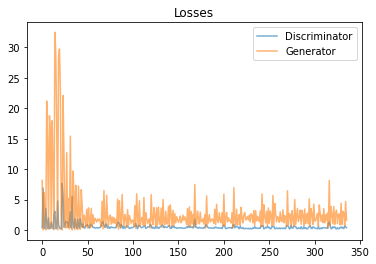

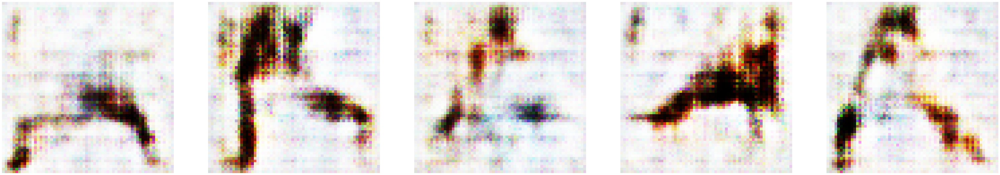

Epoch 22/100 
Duration: 172.57537 
D Loss: 0.34348 
G Loss: 2.07502


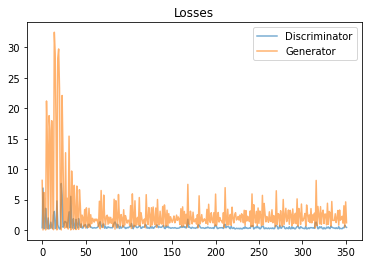

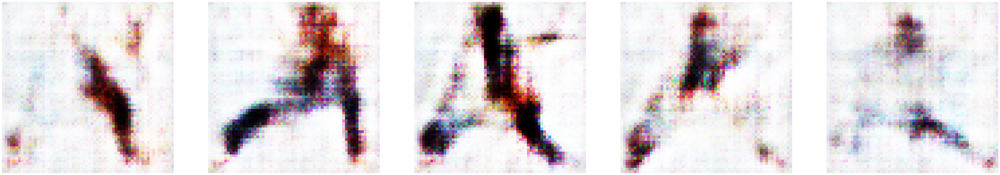

Epoch 23/100 
Duration: 173.89797 
D Loss: 0.31658 
G Loss: 2.32843


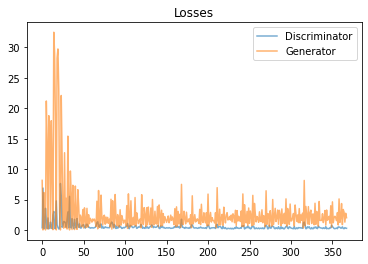

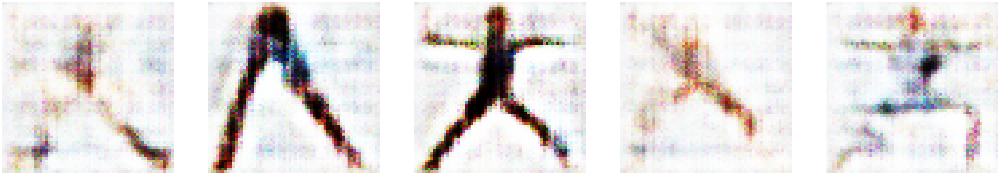

Epoch 24/100 
Duration: 174.64512 
D Loss: 0.30416 
G Loss: 2.30804


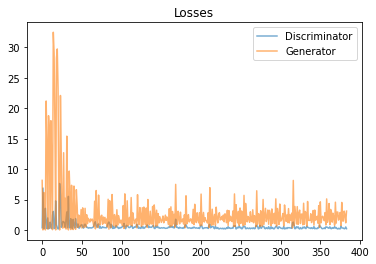

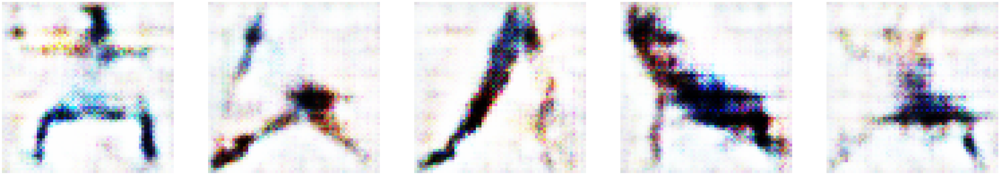

Epoch 25/100 
Duration: 174.54224 
D Loss: 0.46282 
G Loss: 2.30209


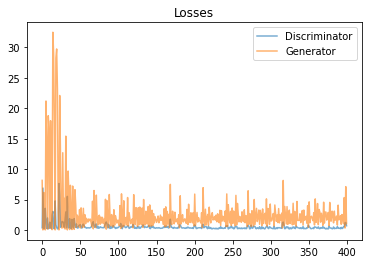

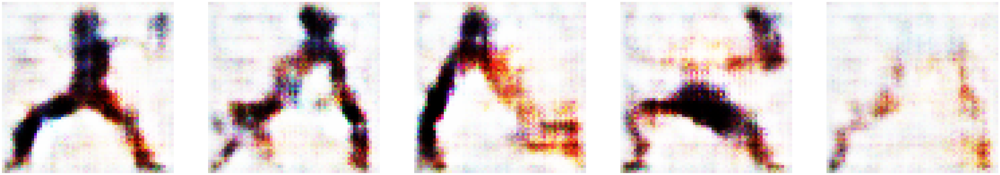

Epoch 26/100 
Duration: 174.21630 
D Loss: 0.40842 
G Loss: 2.11710


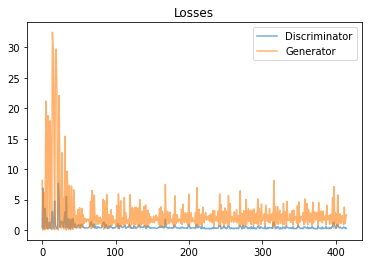

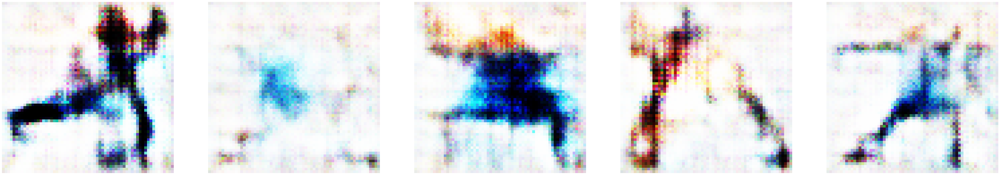

Epoch 27/100 
Duration: 171.87866 
D Loss: 0.24489 
G Loss: 1.94856


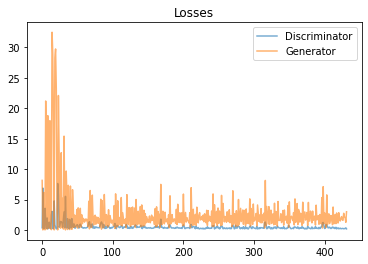

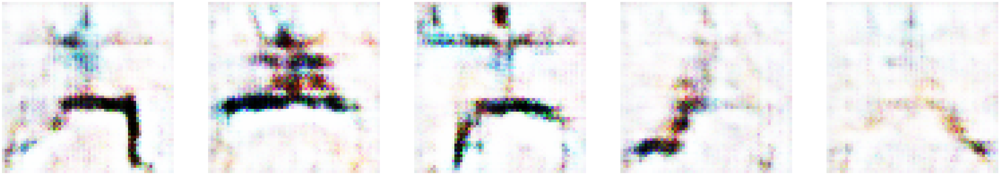

Epoch 28/100 
Duration: 171.01953 
D Loss: 0.26659 
G Loss: 2.09165


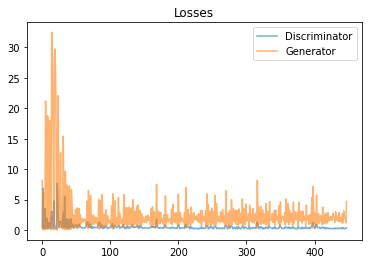

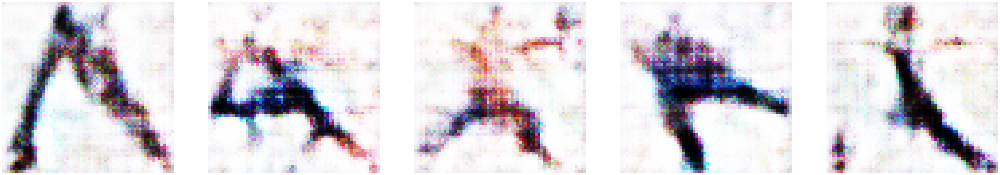

Epoch 29/100 
Duration: 170.55295 
D Loss: 0.62323 
G Loss: 2.16700


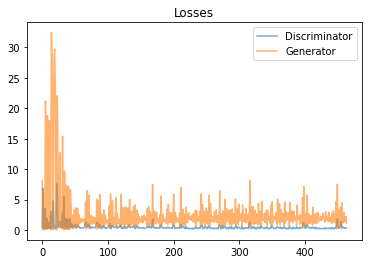

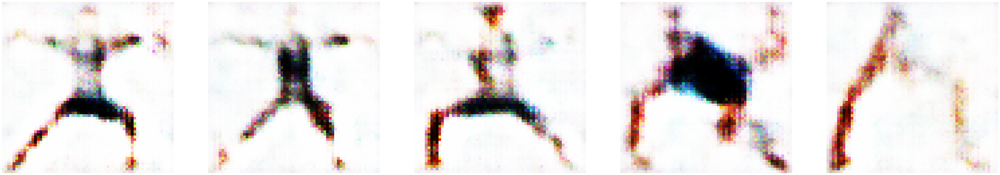

Epoch 30/100 
Duration: 170.30265 
D Loss: 0.32552 
G Loss: 2.00817


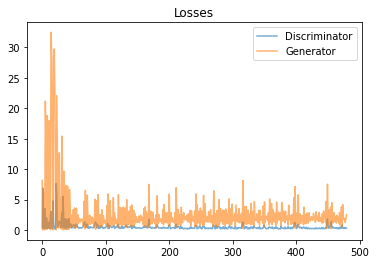

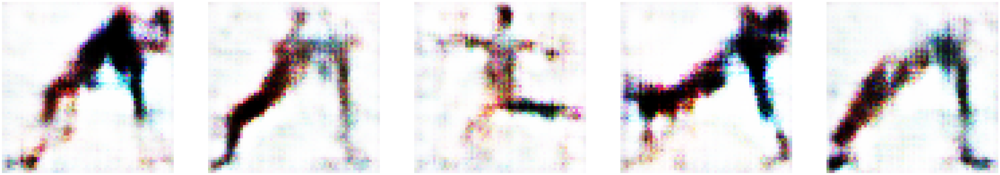

Epoch 31/100 
Duration: 170.73897 
D Loss: 0.28420 
G Loss: 2.03665


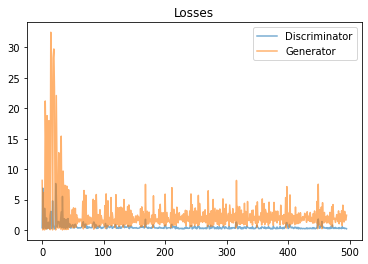

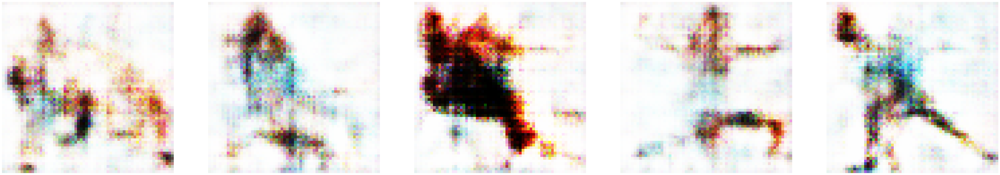

Epoch 32/100 
Duration: 170.03887 
D Loss: 0.29437 
G Loss: 2.22874


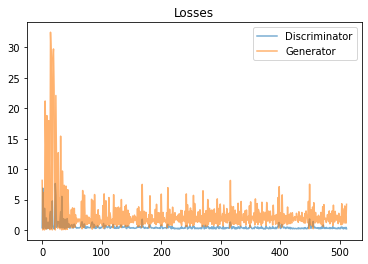

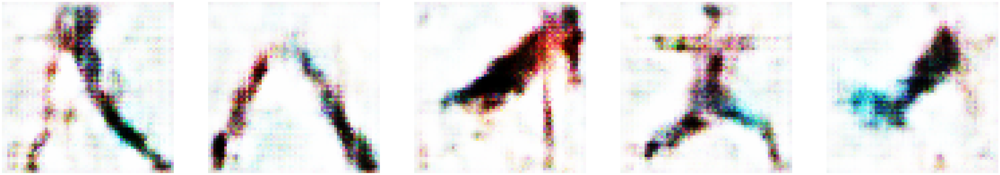

Epoch 33/100 
Duration: 170.00730 
D Loss: 0.46657 
G Loss: 2.37722


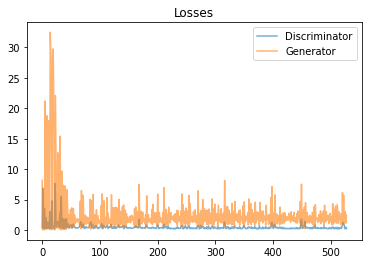

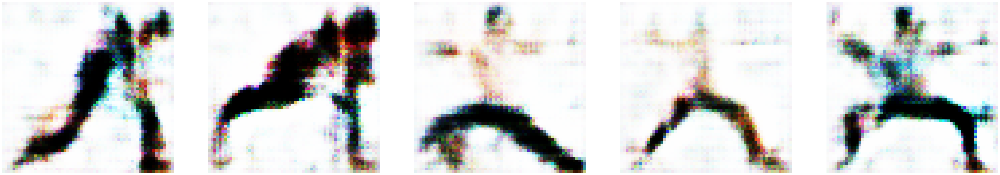

Epoch 34/100 
Duration: 168.24416 
D Loss: 0.34083 
G Loss: 2.00592


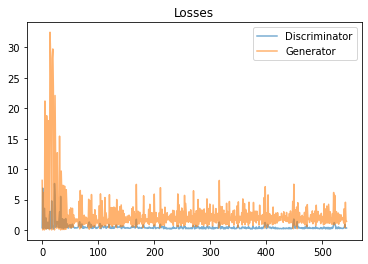

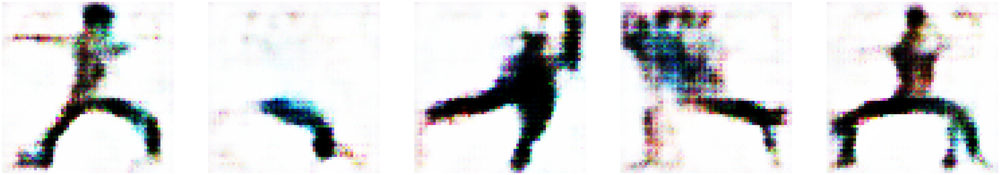

Epoch 35/100 
Duration: 168.65745 
D Loss: 0.27369 
G Loss: 2.09336


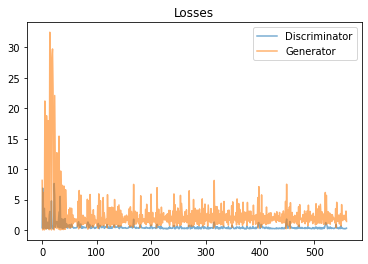

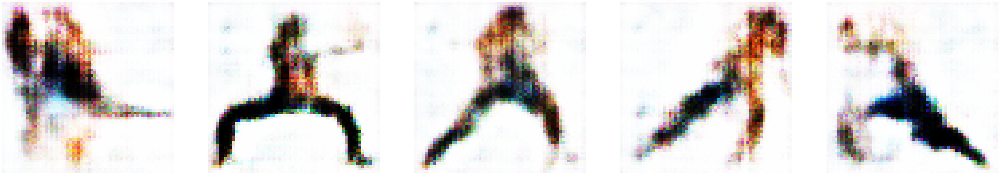

Epoch 36/100 
Duration: 169.88692 
D Loss: 0.20875 
G Loss: 2.16796


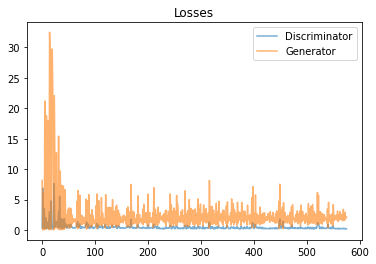

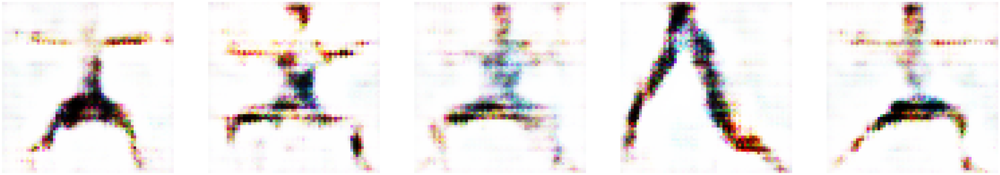

Epoch 37/100 
Duration: 174.58960 
D Loss: 0.22315 
G Loss: 2.23607


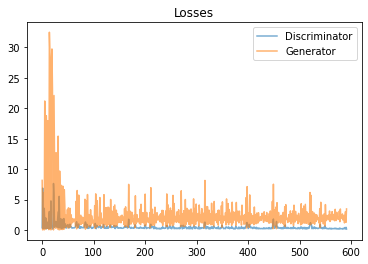

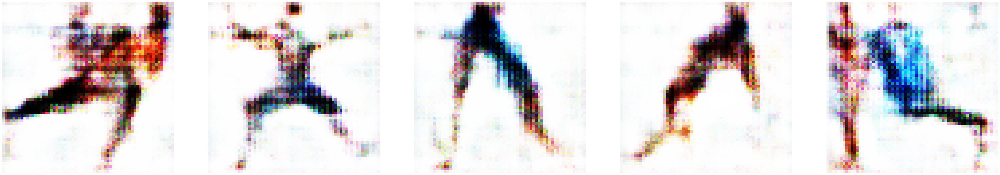

Epoch 38/100 
Duration: 175.71727 
D Loss: 0.54367 
G Loss: 2.68280


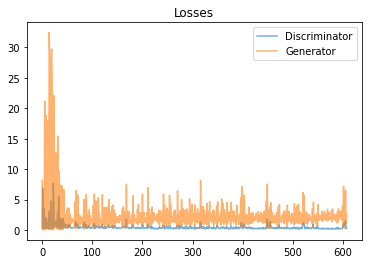

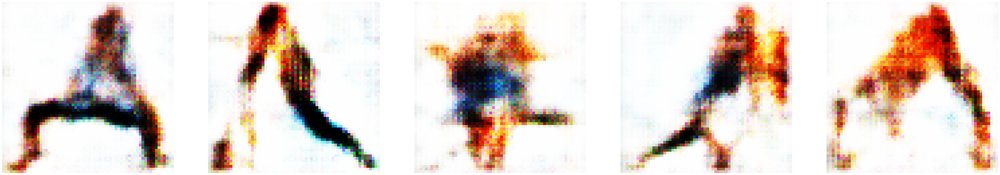

Epoch 39/100 
Duration: 174.23717 
D Loss: 0.39339 
G Loss: 1.95720


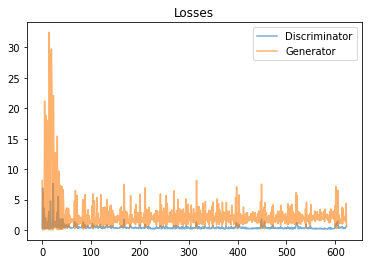

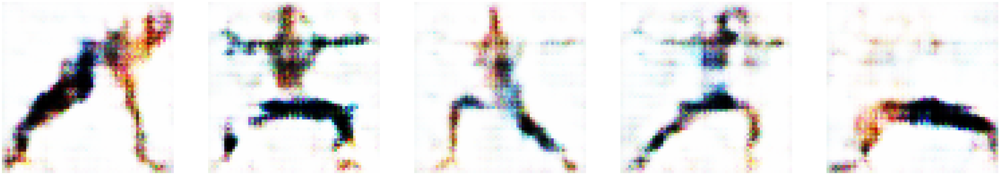

Epoch 40/100 
Duration: 173.63032 
D Loss: 0.24635 
G Loss: 2.05352


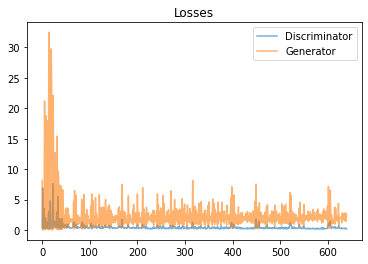

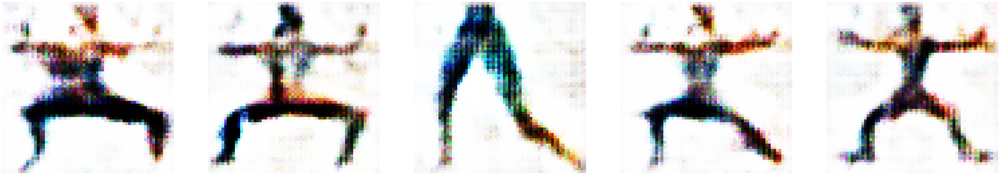

Epoch 41/100 
Duration: 172.99755 
D Loss: 0.35381 
G Loss: 2.44635


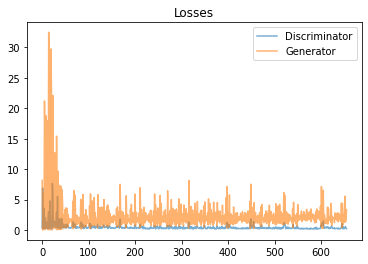

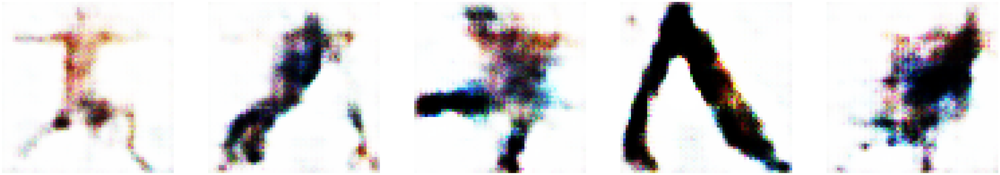

Epoch 42/100 
Duration: 171.24152 
D Loss: 0.28232 
G Loss: 2.10256


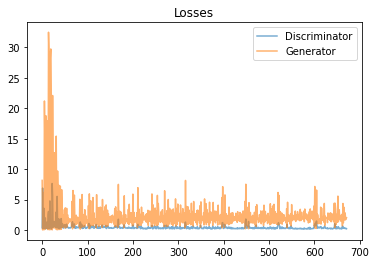

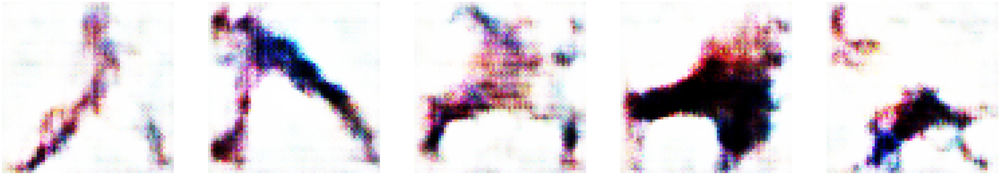

Epoch 43/100 
Duration: 171.22791 
D Loss: 0.26274 
G Loss: 2.25287


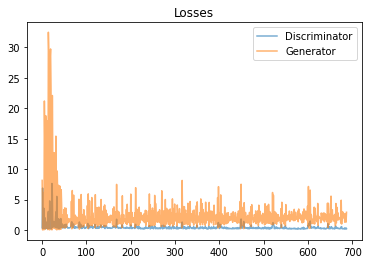

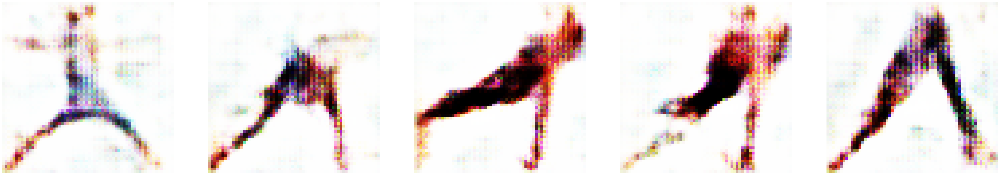

Epoch 44/100 
Duration: 172.00283 
D Loss: 0.19940 
G Loss: 2.22311


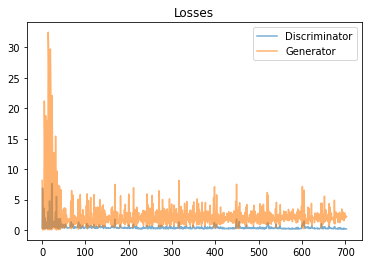

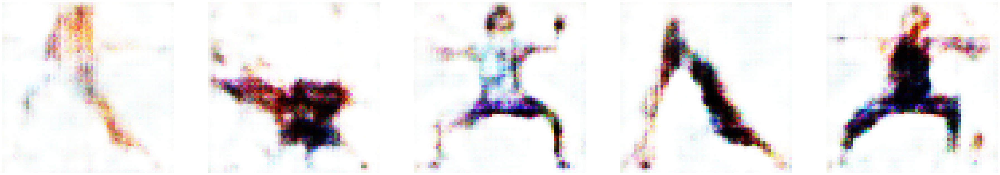

Epoch 45/100 
Duration: 171.51809 
D Loss: 0.32548 
G Loss: 2.29983


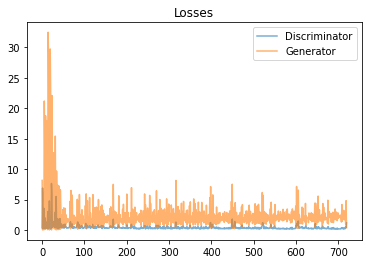

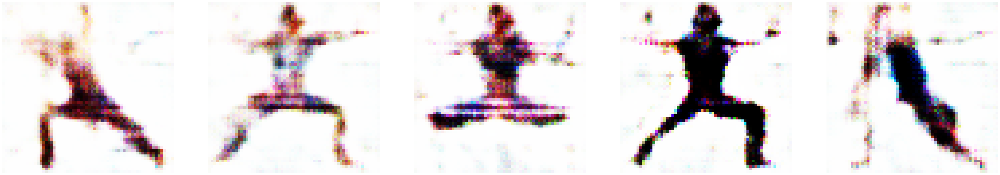

Epoch 46/100 
Duration: 171.44038 
D Loss: 0.63115 
G Loss: 2.48554


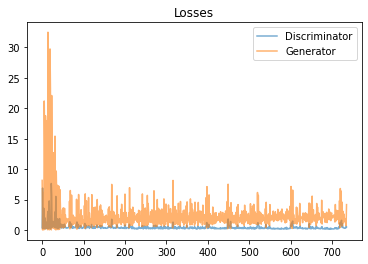

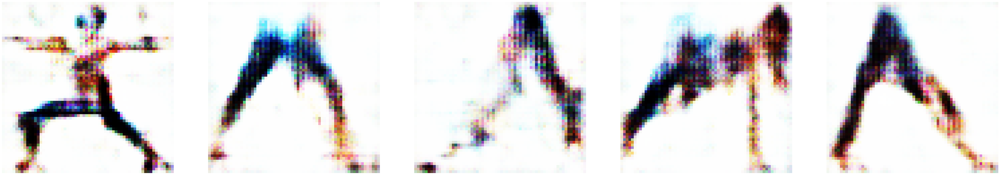

Epoch 47/100 
Duration: 172.60994 
D Loss: 0.28280 
G Loss: 2.08905


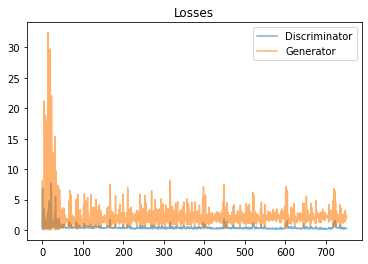

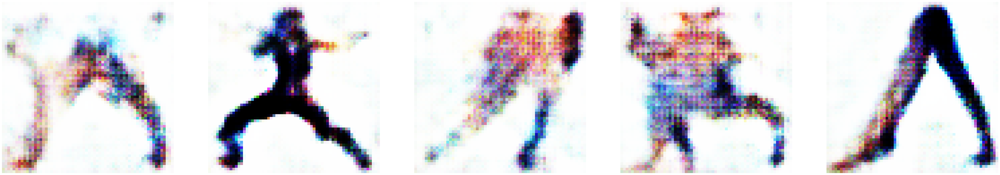

Epoch 48/100 
Duration: 170.91259 
D Loss: 0.23236 
G Loss: 2.32166


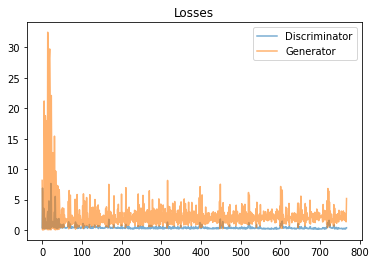

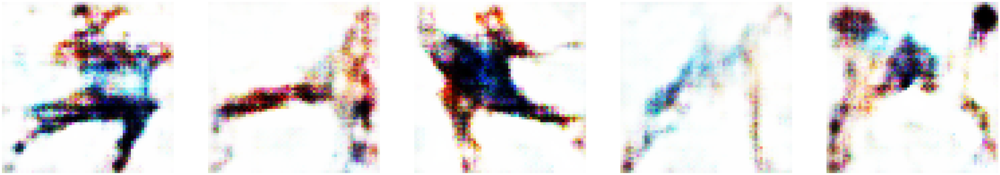

Epoch 49/100 
Duration: 170.31243 
D Loss: 0.22049 
G Loss: 2.24781


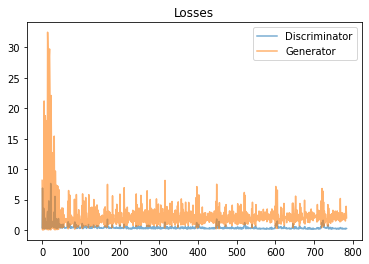

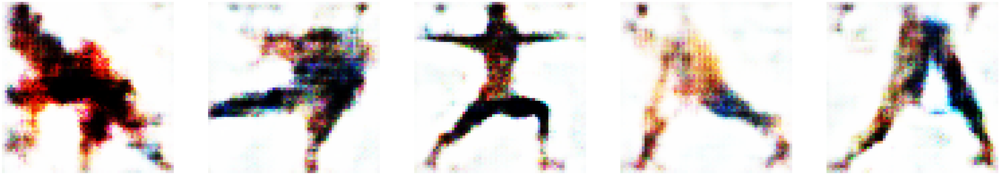

Epoch 50/100 
Duration: 170.93935 
D Loss: 0.19447 
G Loss: 2.28359


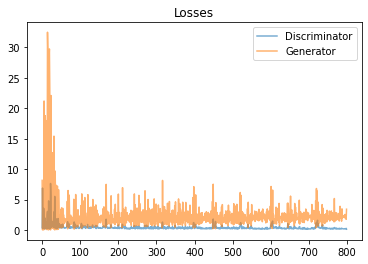

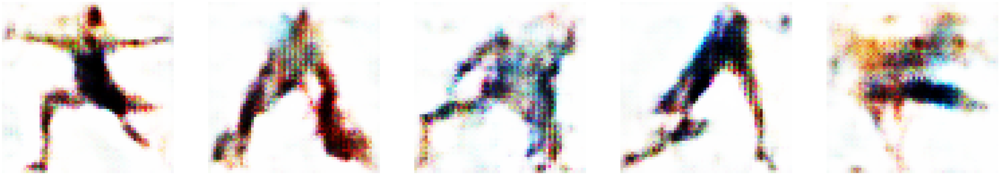

Epoch 51/100 
Duration: 171.09900 
D Loss: 0.22099 
G Loss: 2.29983


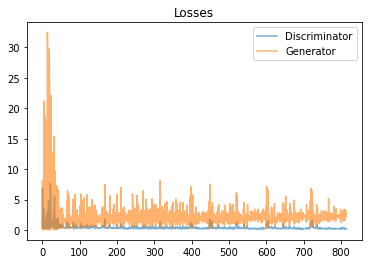

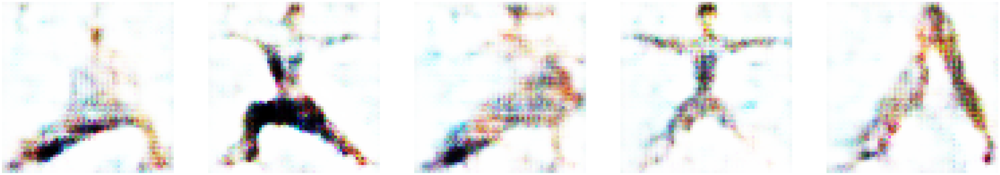

Epoch 52/100 
Duration: 171.21753 
D Loss: 0.53151 
G Loss: 2.58164


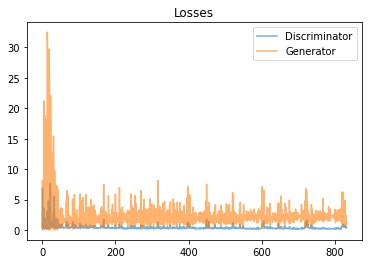

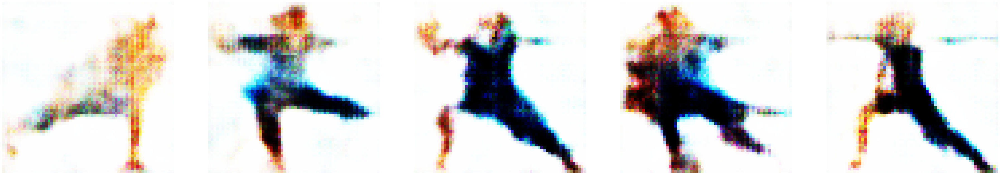

Epoch 53/100 
Duration: 171.22175 
D Loss: 0.41070 
G Loss: 2.49824


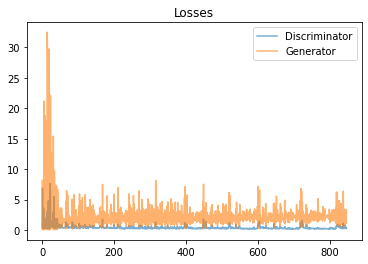

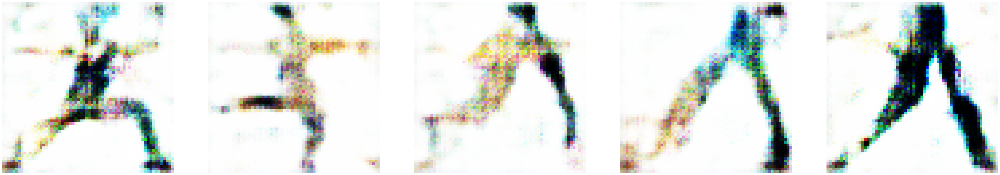

Epoch 54/100 
Duration: 170.82384 
D Loss: 0.28613 
G Loss: 2.26285


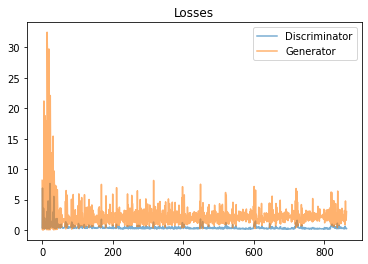

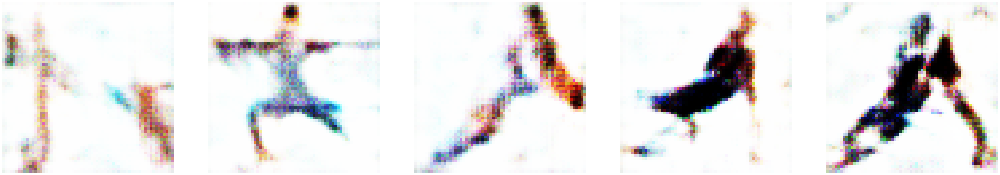

Epoch 55/100 
Duration: 171.23039 
D Loss: 0.22983 
G Loss: 2.20604


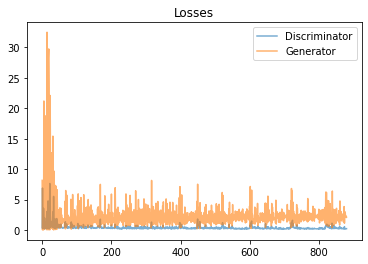

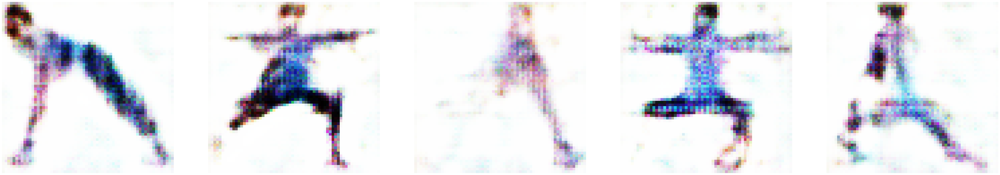

Epoch 56/100 
Duration: 170.47485 
D Loss: 0.20948 
G Loss: 2.27125


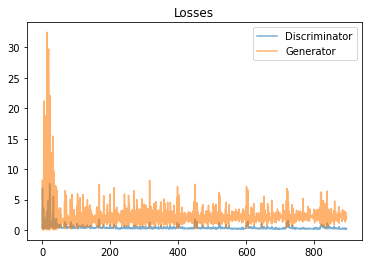

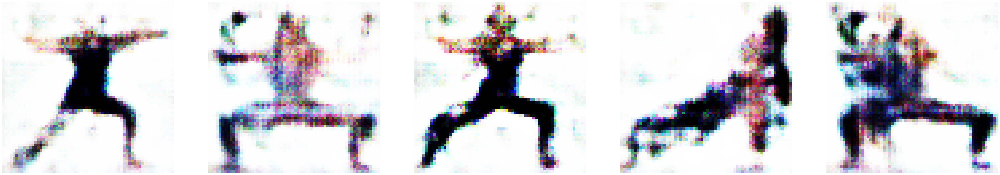

Epoch 57/100 
Duration: 170.22164 
D Loss: 0.29056 
G Loss: 2.61547


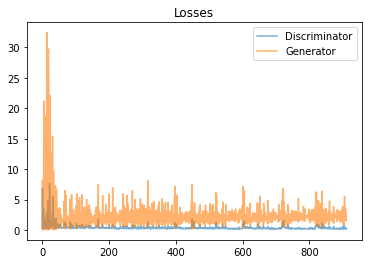

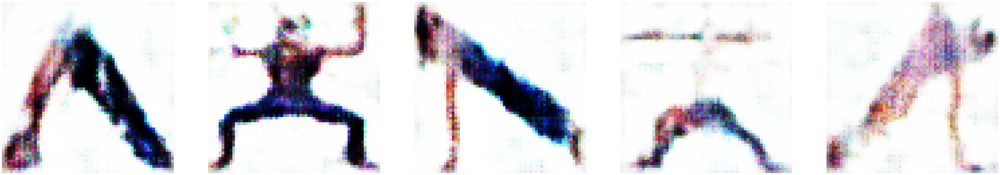

Epoch 58/100 
Duration: 170.79311 
D Loss: 0.54716 
G Loss: 2.68593


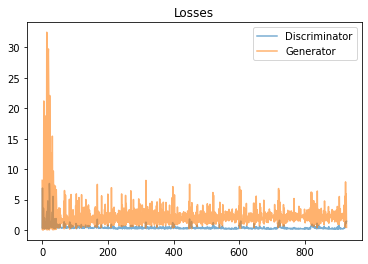

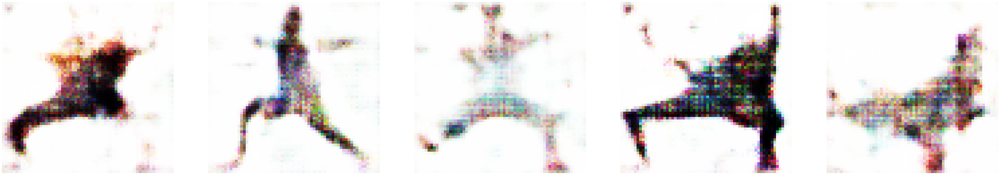

Epoch 59/100 
Duration: 170.97786 
D Loss: 0.52068 
G Loss: 2.24161


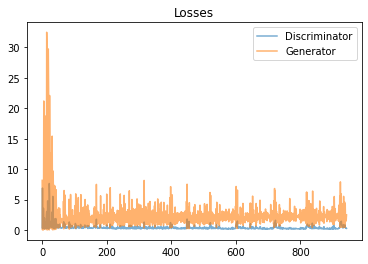

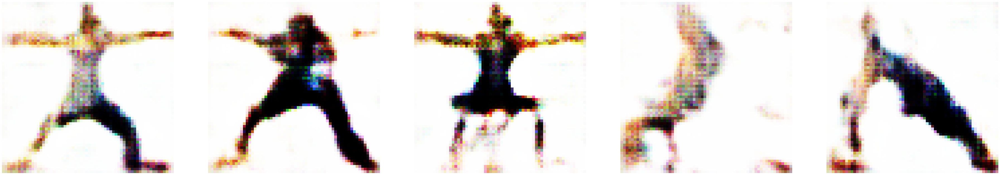

Epoch 60/100 
Duration: 170.49512 
D Loss: 0.24541 
G Loss: 2.06201


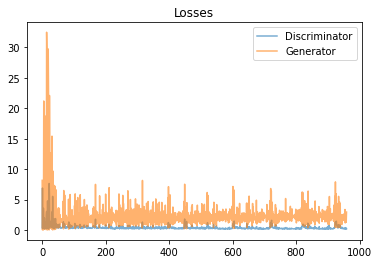

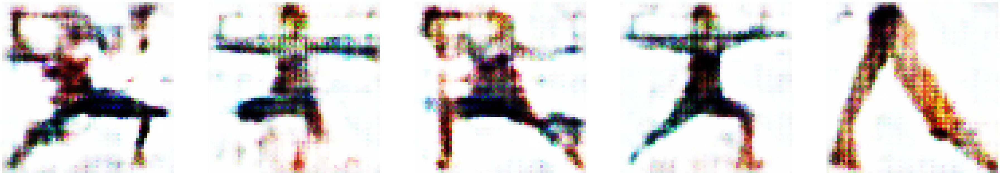

Epoch 61/100 
Duration: 171.64061 
D Loss: 0.19592 
G Loss: 2.18034


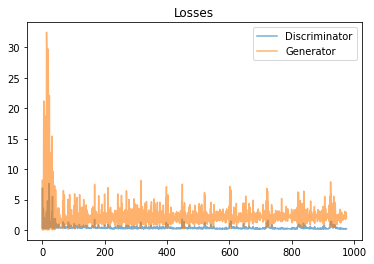

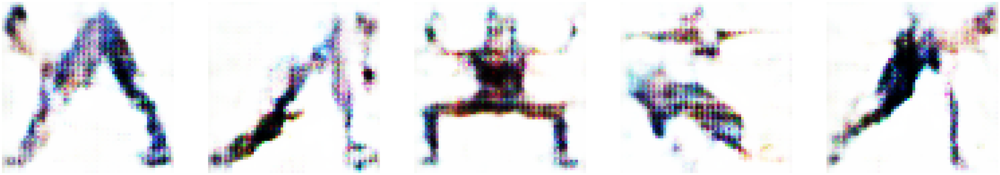

Epoch 62/100 
Duration: 171.23995 
D Loss: 0.20060 
G Loss: 2.25097


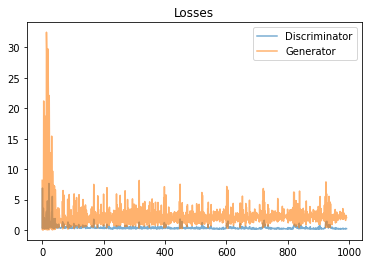

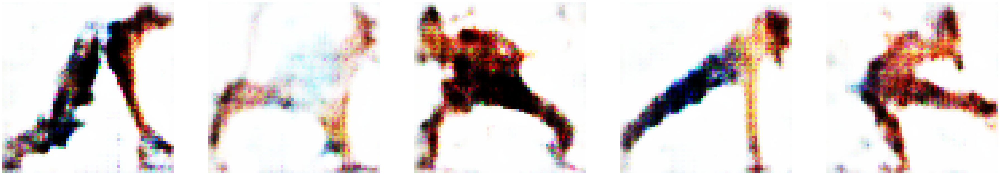

Epoch 63/100 
Duration: 169.35619 
D Loss: 0.18187 
G Loss: 2.28149


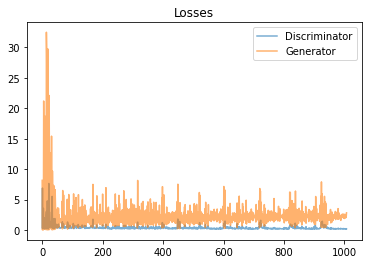

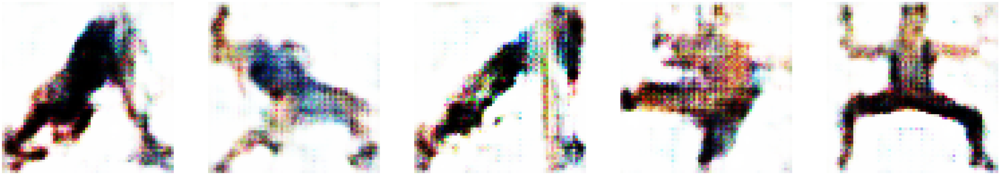

Epoch 64/100 
Duration: 168.42081 
D Loss: 0.29259 
G Loss: 2.58118


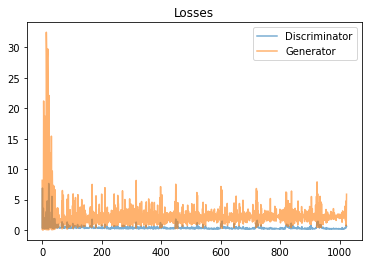

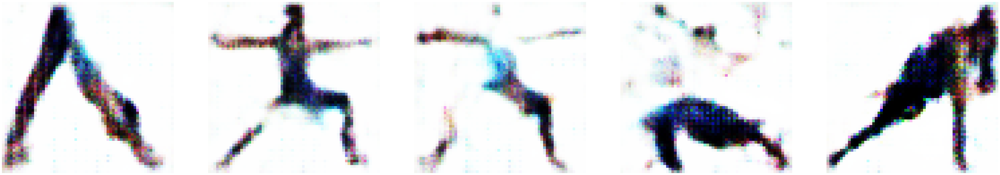

Epoch 65/100 
Duration: 169.25641 
D Loss: 0.29273 
G Loss: 2.28652


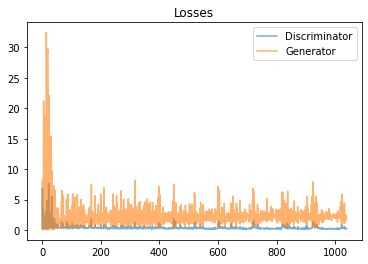

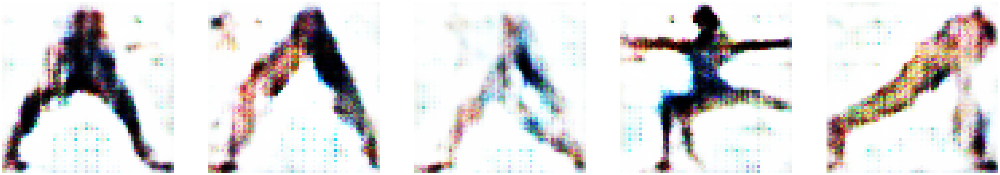

Epoch 66/100 
Duration: 168.12083 
D Loss: 0.25927 
G Loss: 2.42157


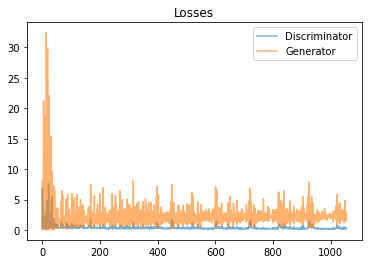

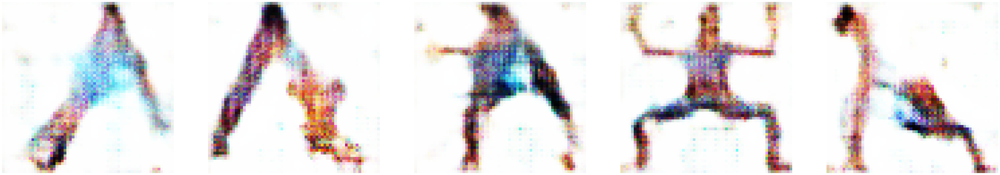

Epoch 67/100 
Duration: 169.15865 
D Loss: 0.24123 
G Loss: 2.28961


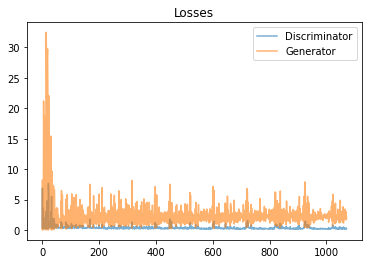

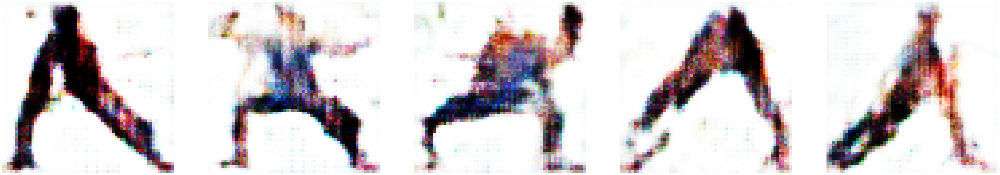

Epoch 68/100 
Duration: 170.38519 
D Loss: 0.23183 
G Loss: 2.31115


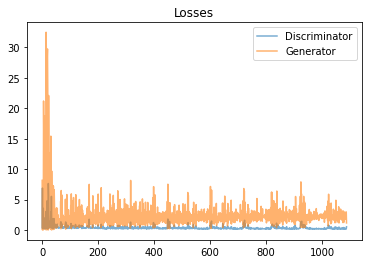

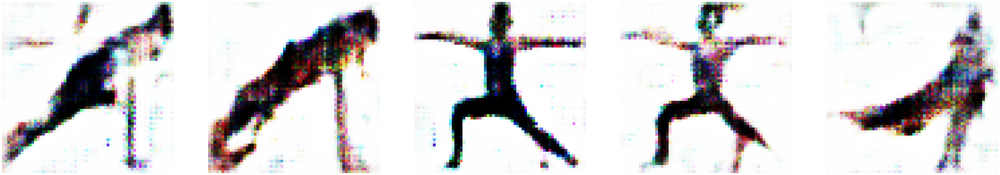

Epoch 69/100 
Duration: 170.83102 
D Loss: 0.76677 
G Loss: 2.99677


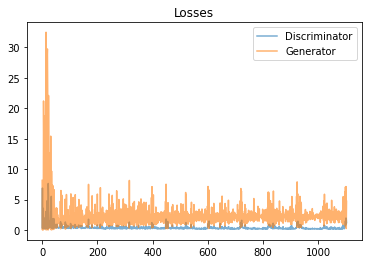

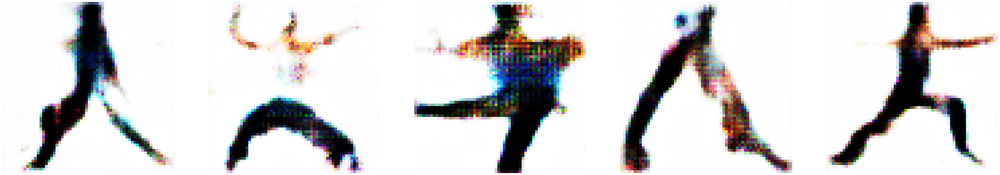

Epoch 70/100 
Duration: 172.68247 
D Loss: 0.49686 
G Loss: 1.82043


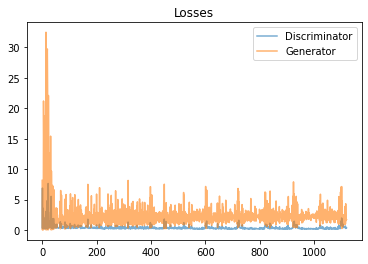

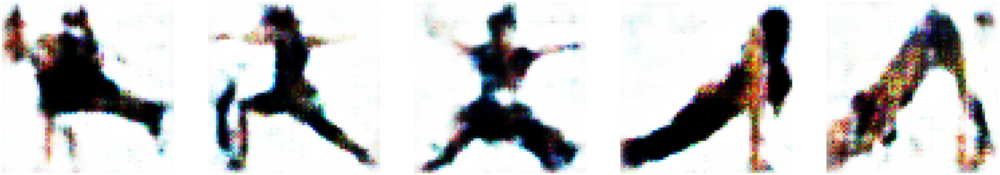

Epoch 71/100 
Duration: 173.32239 
D Loss: 0.34436 
G Loss: 2.02557


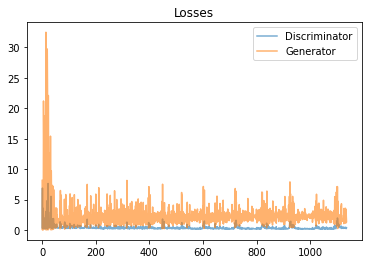

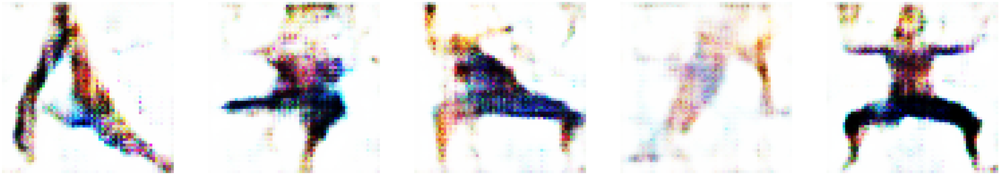

Epoch 72/100 
Duration: 174.01423 
D Loss: 0.27819 
G Loss: 2.21984


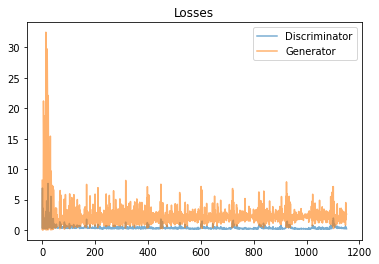

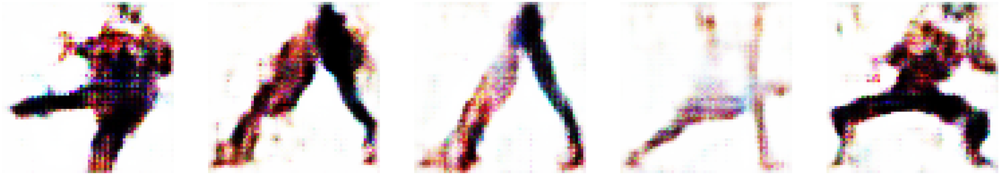

Epoch 73/100 
Duration: 173.83700 
D Loss: 0.23674 
G Loss: 2.21778


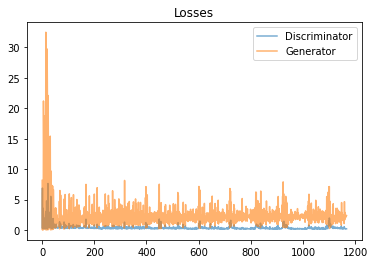

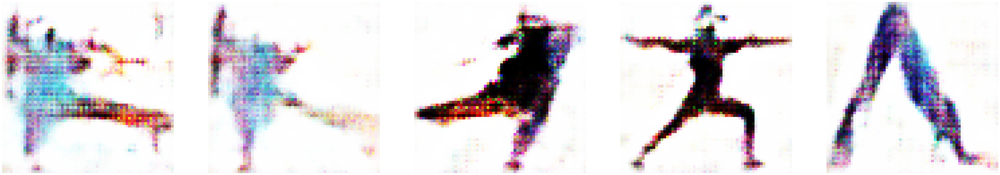

Epoch 74/100 
Duration: 173.20058 
D Loss: 0.21815 
G Loss: 2.24022


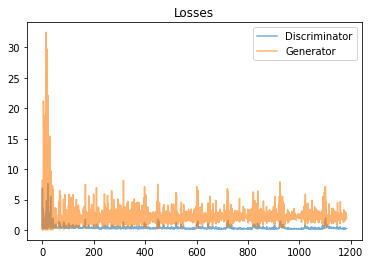

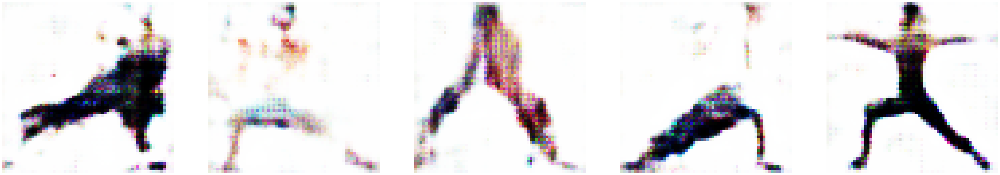

Epoch 75/100 
Duration: 173.93512 
D Loss: 0.18244 
G Loss: 2.32109


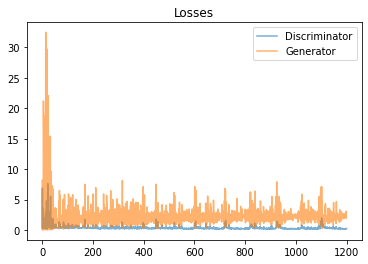

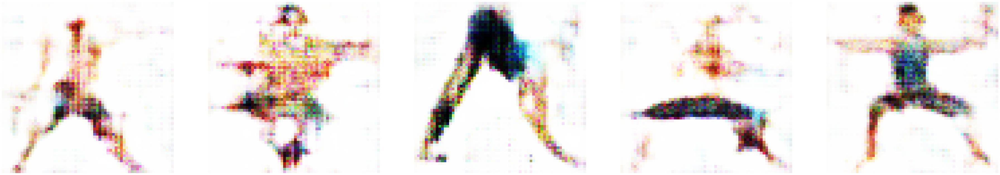

Epoch 76/100 
Duration: 173.62827 
D Loss: 0.23164 
G Loss: 2.29498


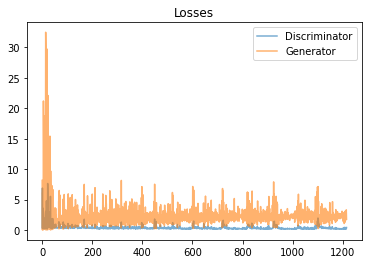

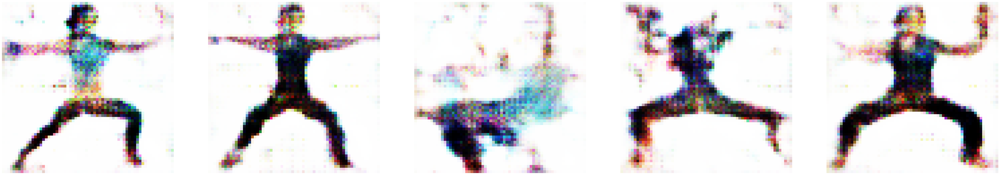

Epoch 77/100 
Duration: 176.61830 
D Loss: 0.24577 
G Loss: 2.29876


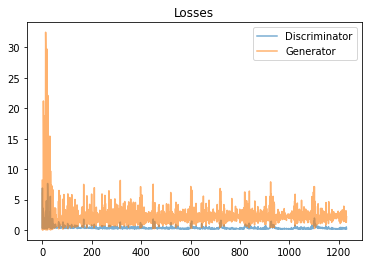

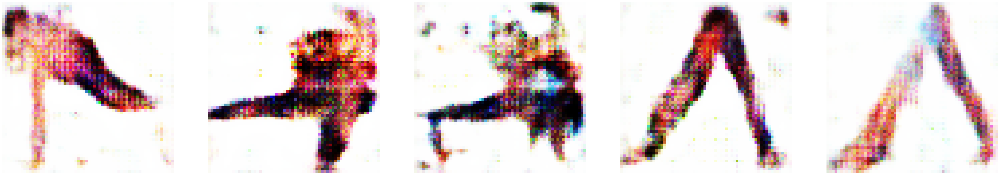

Epoch 78/100 
Duration: 174.74506 
D Loss: 0.21127 
G Loss: 2.41963


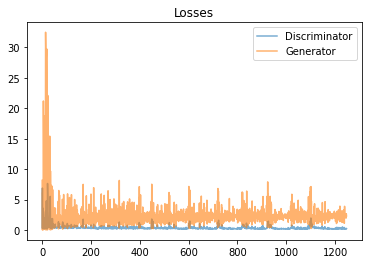

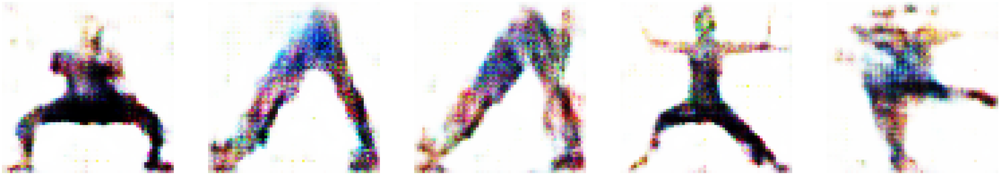

Epoch 79/100 
Duration: 173.83199 
D Loss: 0.21514 
G Loss: 2.39948


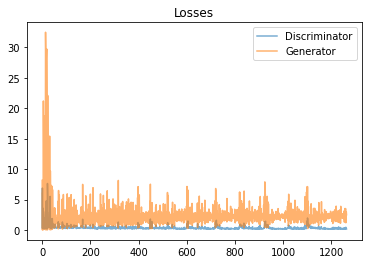

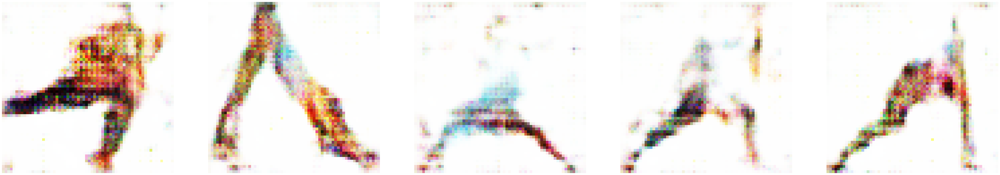

Epoch 80/100 
Duration: 174.71192 
D Loss: 0.26585 
G Loss: 2.40772


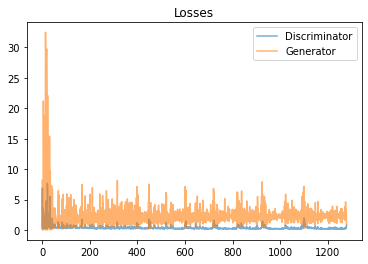

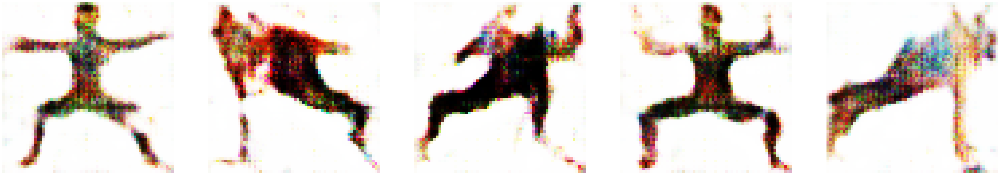

Epoch 81/100 
Duration: 173.38585 
D Loss: 0.95960 
G Loss: 2.52518


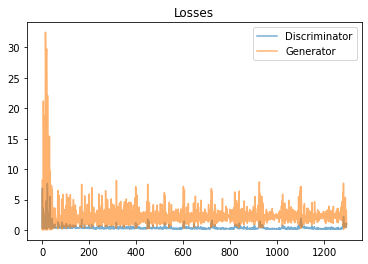

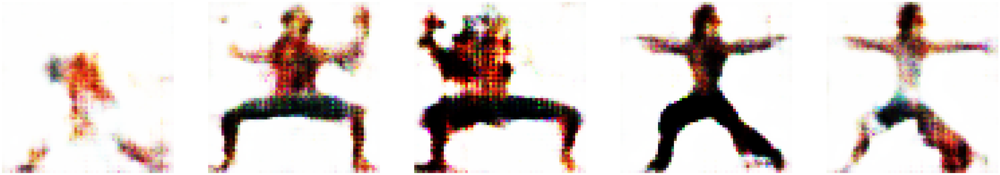

Epoch 82/100 
Duration: 172.43671 
D Loss: 0.35688 
G Loss: 1.96043


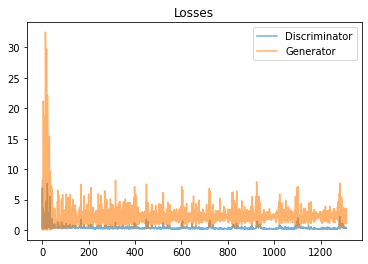

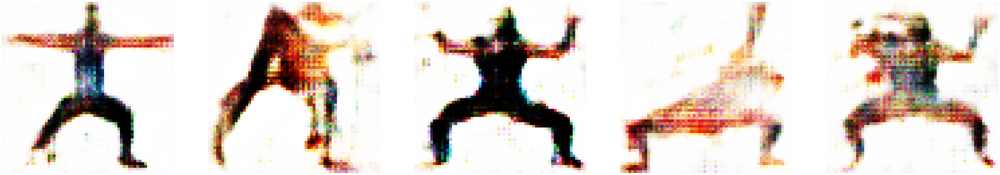

Epoch 83/100 
Duration: 172.99896 
D Loss: 0.25420 
G Loss: 2.19141


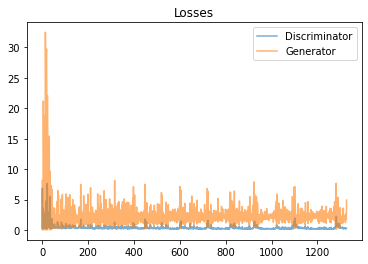

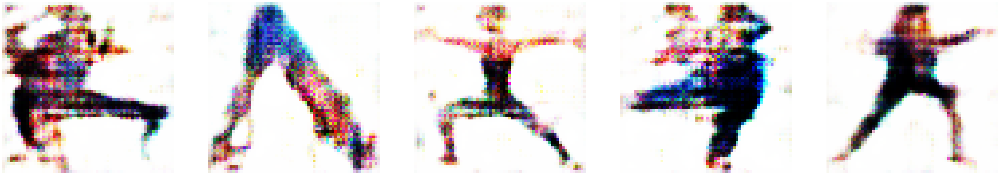

Epoch 84/100 
Duration: 173.86395 
D Loss: 0.30365 
G Loss: 2.21882


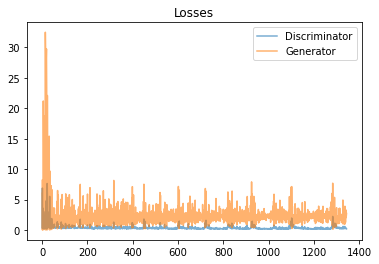

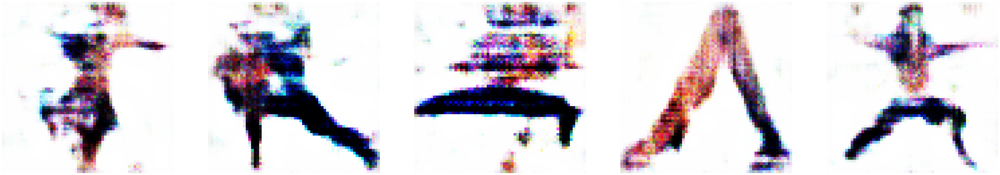

Epoch 85/100 
Duration: 172.20275 
D Loss: 0.22489 
G Loss: 2.21043


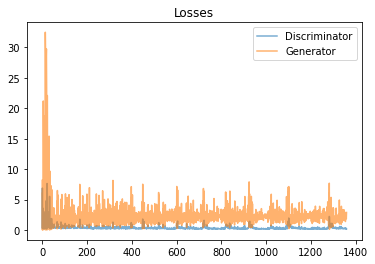

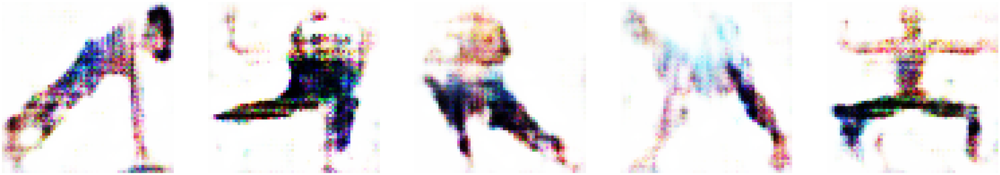

Epoch 86/100 
Duration: 172.57505 
D Loss: 0.20323 
G Loss: 2.22934


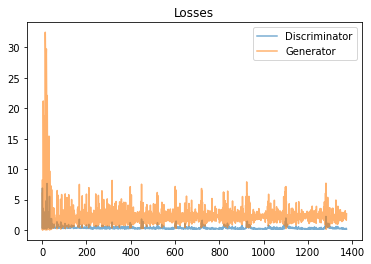

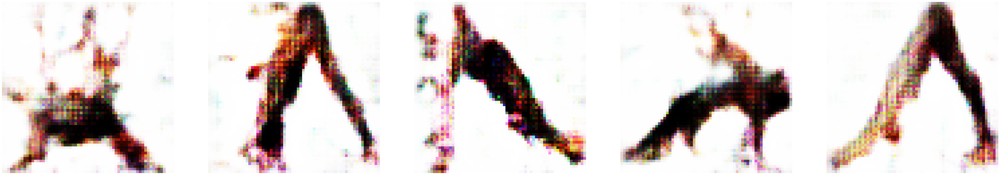

Epoch 87/100 
Duration: 172.14287 
D Loss: 0.17815 
G Loss: 2.38526


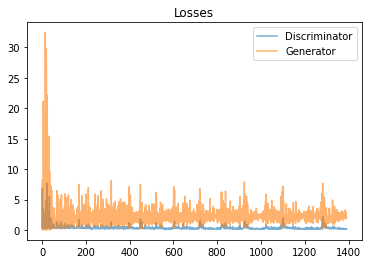

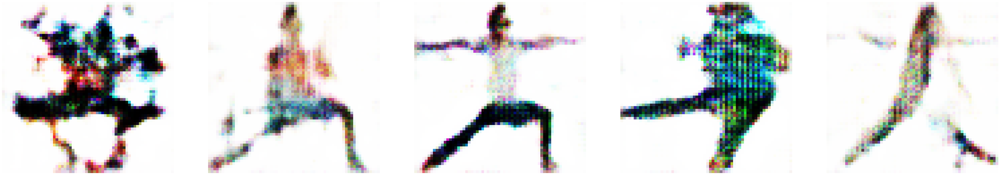

Epoch 88/100 
Duration: 171.72508 
D Loss: 0.18505 
G Loss: 2.43841


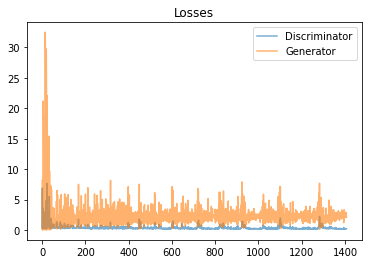

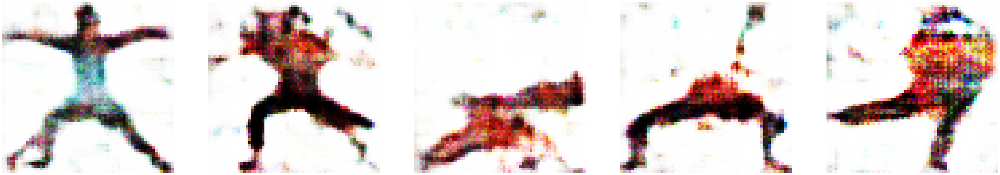

Epoch 89/100 
Duration: 174.75150 
D Loss: 0.21401 
G Loss: 2.46614


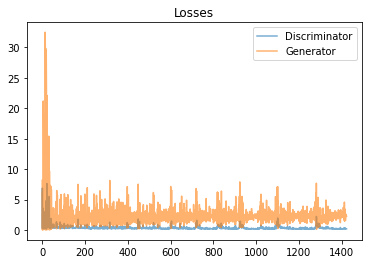

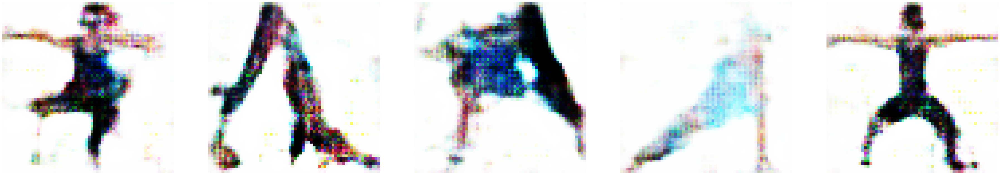

Epoch 90/100 
Duration: 173.26451 
D Loss: 0.17803 
G Loss: 2.37106


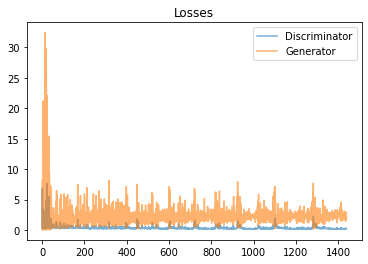

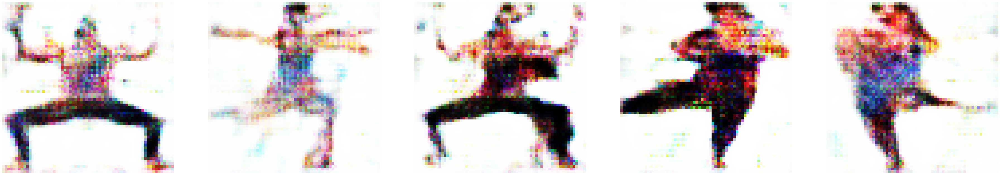

Epoch 91/100 
Duration: 174.80336 
D Loss: 0.22190 
G Loss: 2.52402


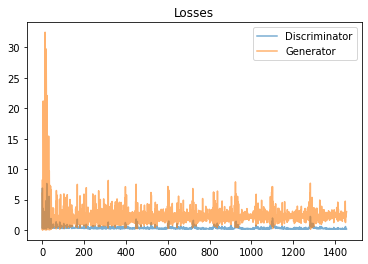

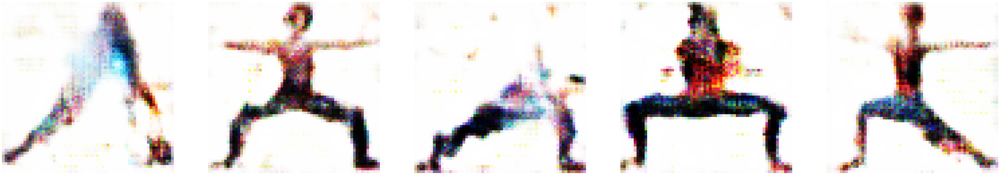

Epoch 92/100 
Duration: 172.94210 
D Loss: 0.20467 
G Loss: 2.49629


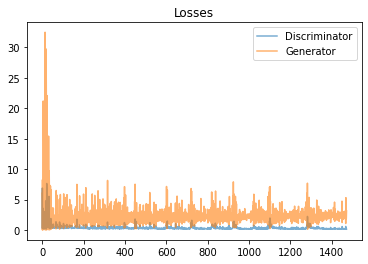

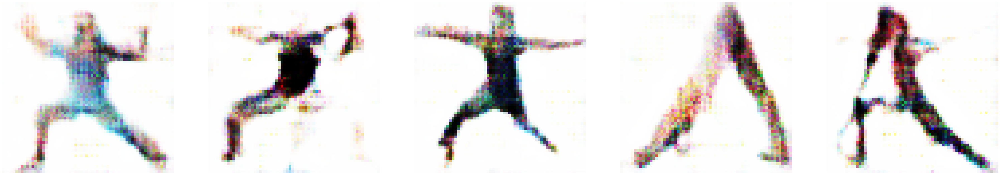

Epoch 93/100 
Duration: 171.97162 
D Loss: 0.23916 
G Loss: 2.52278


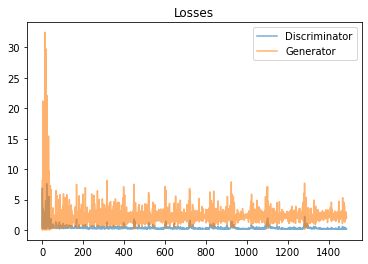

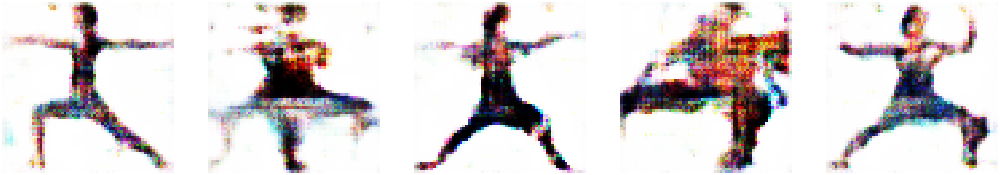

Epoch 94/100 
Duration: 171.59307 
D Loss: 0.19207 
G Loss: 2.54723


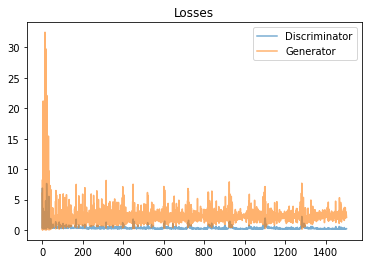

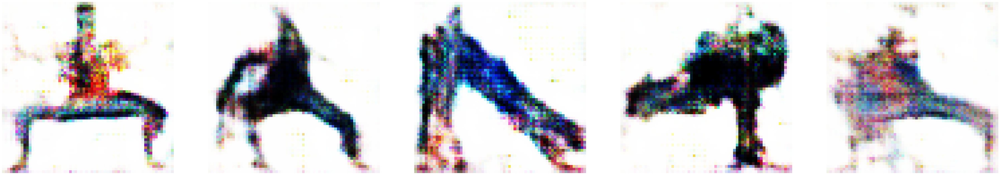

Epoch 95/100 
Duration: 171.07966 
D Loss: 0.17448 
G Loss: 2.49608


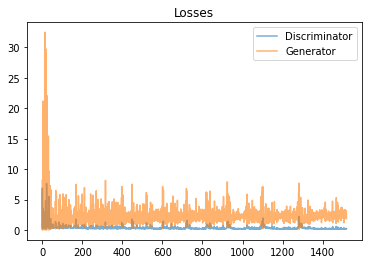

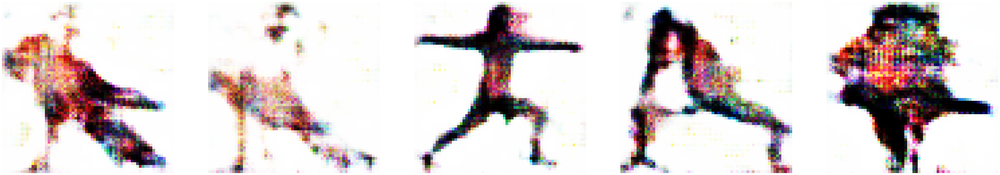

Epoch 96/100 
Duration: 172.41775 
D Loss: 0.16509 
G Loss: 2.68833


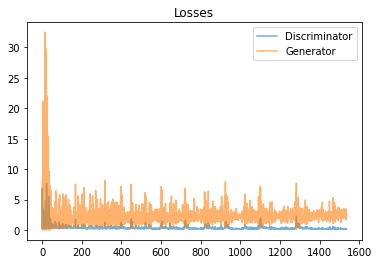

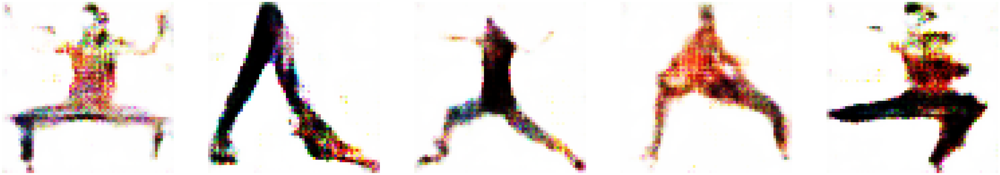

Epoch 97/100 
Duration: 173.52047 
D Loss: 0.17708 
G Loss: 2.56558


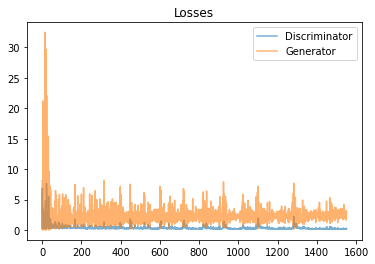

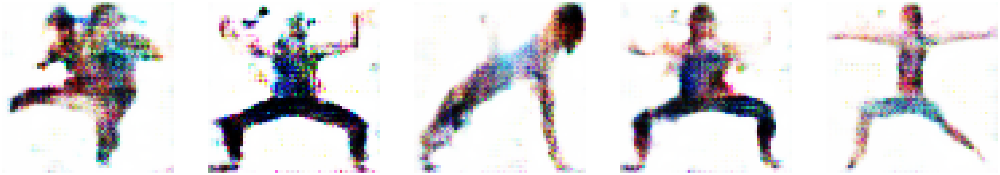

Epoch 98/100 
Duration: 172.83842 
D Loss: 1.07283 
G Loss: 3.10825


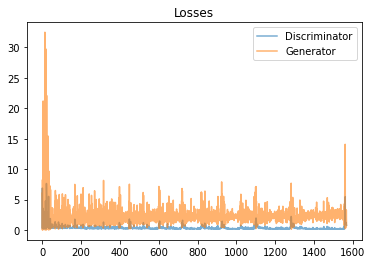

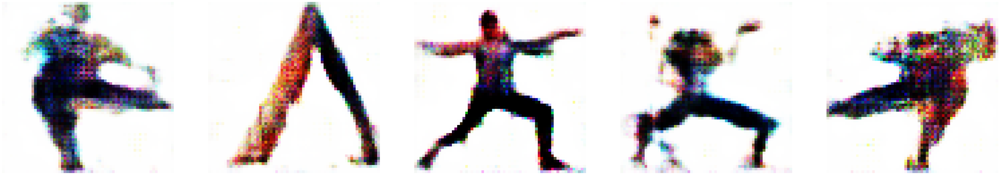

Epoch 99/100 
Duration: 174.62477 
D Loss: 0.43902 
G Loss: 1.85297


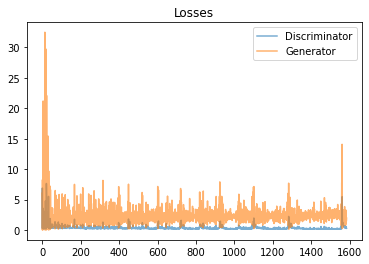

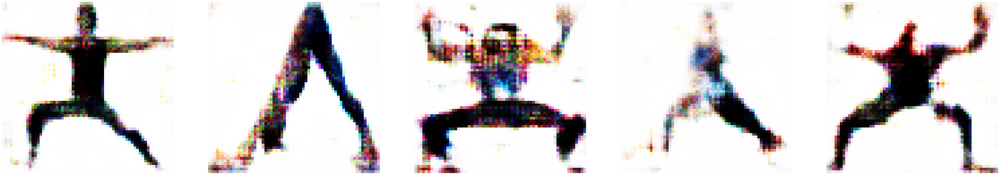

Epoch 100/100 
Duration: 173.45955 
D Loss: 0.30444 
G Loss: 2.11341


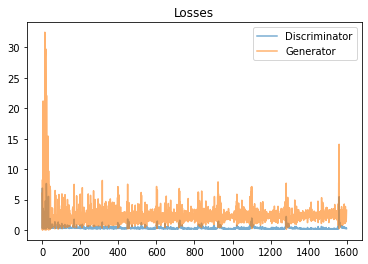

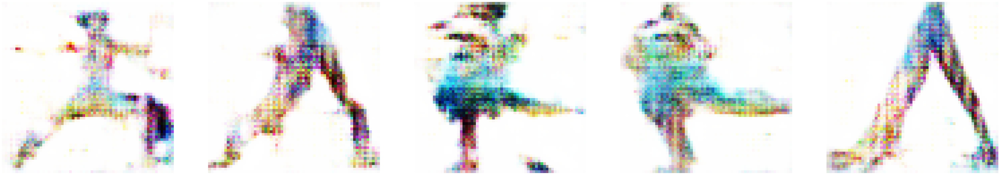

>> Generating 1k images ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


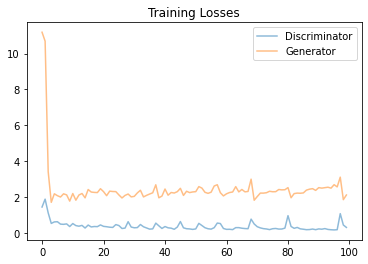

>> train time =  17667.495700120926


In [ ]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

### **save the generated yoga poses**

In [ ]:
!zip -r ./generated-images.zip ./generated-images/

Streaminguitvoer ingekort tot de laatste 5000 regels.
  adding: generated-images/pose_27_58.png (stored 0%)
  adding: generated-images/pose_17_0.png (stored 0%)
  adding: generated-images/pose_16_40.png (stored 0%)
  adding: generated-images/pose_33_52.png (stored 0%)
  adding: generated-images/pose_68_53.png (stored 0%)
  adding: generated-images/pose_94_39.png (stored 0%)
  adding: generated-images/pose_9_83.png (stored 0%)
  adding: generated-images/pose_97_46.png (stored 0%)
  adding: generated-images/pose_12_82.png (stored 0%)
  adding: generated-images/pose_99_93.png (stored 0%)
  adding: generated-images/pose_92_53.png (stored 0%)
  adding: generated-images/pose_46_77.png (stored 0%)
  adding: generated-images/pose_33_3.png (stored 0%)
  adding: generated-images/pose_60_64.png (stored 0%)
  adding: generated-images/pose_75_97.png (stored 0%)
  adding: generated-images/pose_11_71.png (stored 0%)
  adding: generated-images/pose_82_64.png (stored 0%)
  adding: generated-images/pose

In [ ]:
from google.colab import files
files.download("/content/generated-images.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

images =  10000


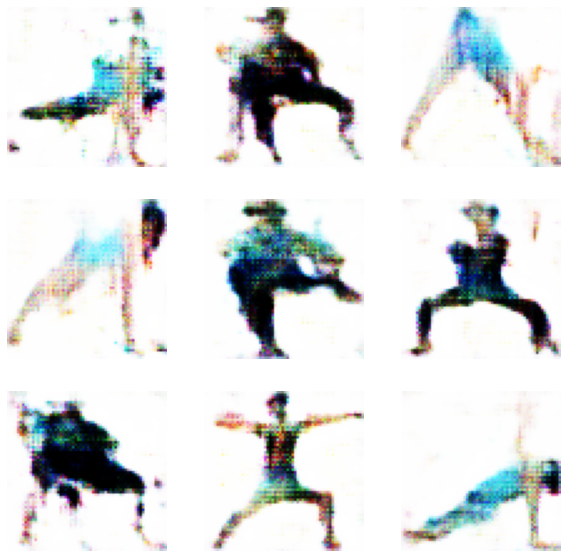

In [ ]:
imgs = os.listdir('generated-images')
print ("images = ",len(imgs))

plt.figure(figsize=(10,10))
for i,image in enumerate(imgs):
    im= Image.open('generated-images/'+image)
    plt.subplot(3,3,i+1)
    plt.axis("off")
    plt.imshow(im)    
    if(i==8):
        break